In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D 
from matplotlib.gridspec import GridSpec
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina')

import numpy as np
import pandas as pd
import scipy.stats as stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error

import sys, os
import warnings

/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/3217211228.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data1['Classification'].iloc[mt]= 'def_Up'
/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/32172

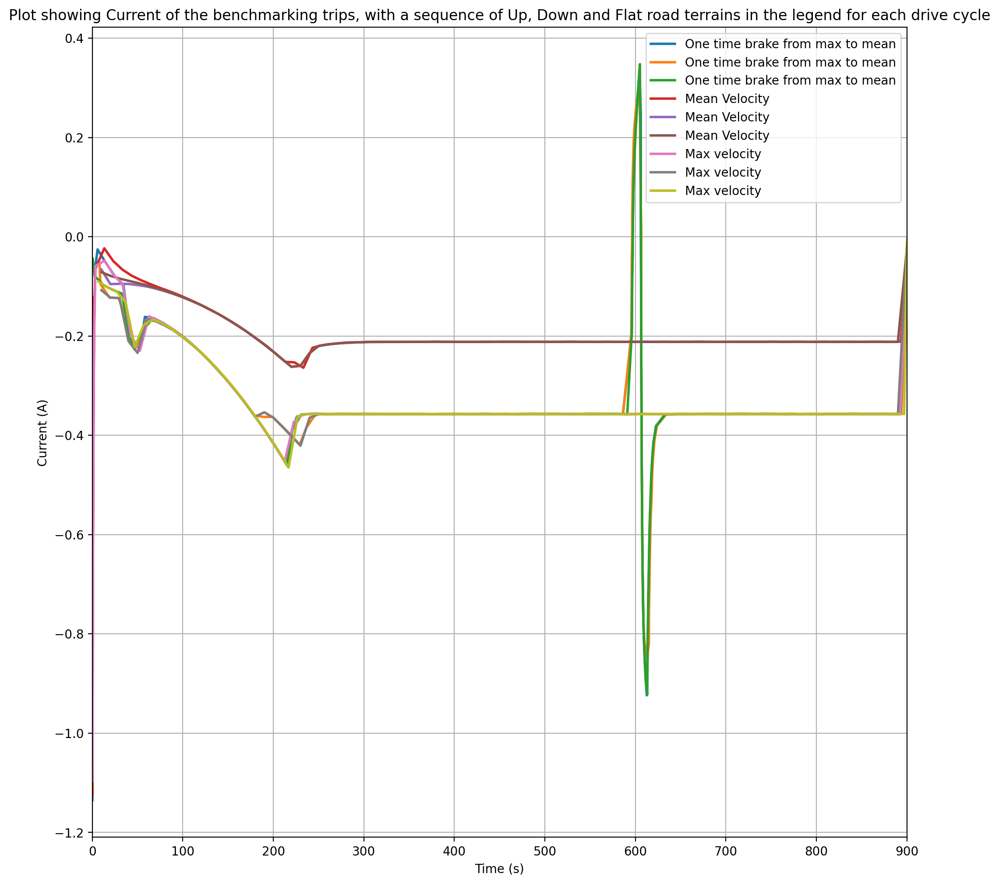

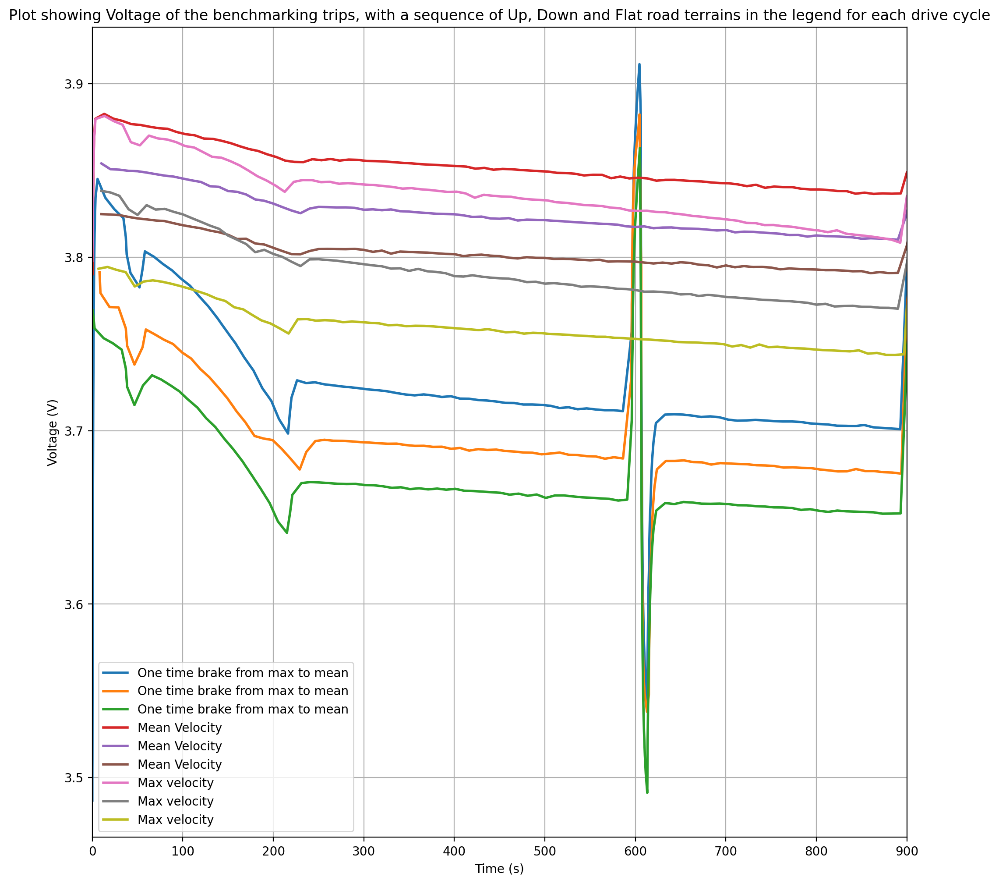

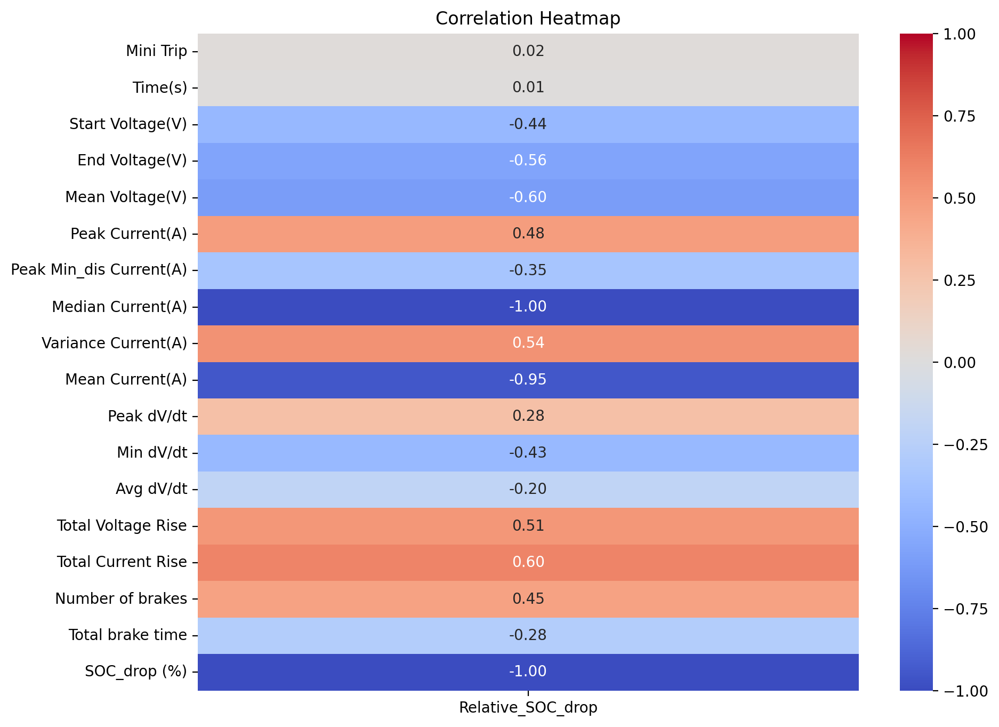

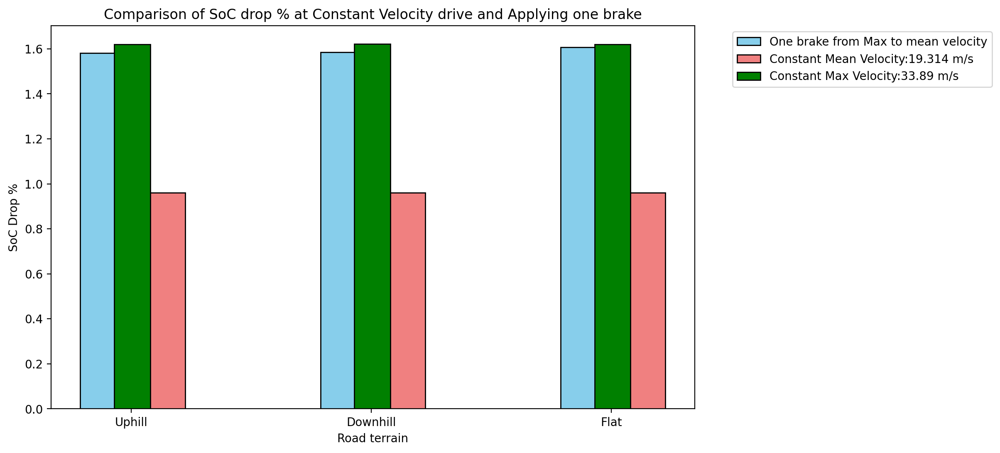

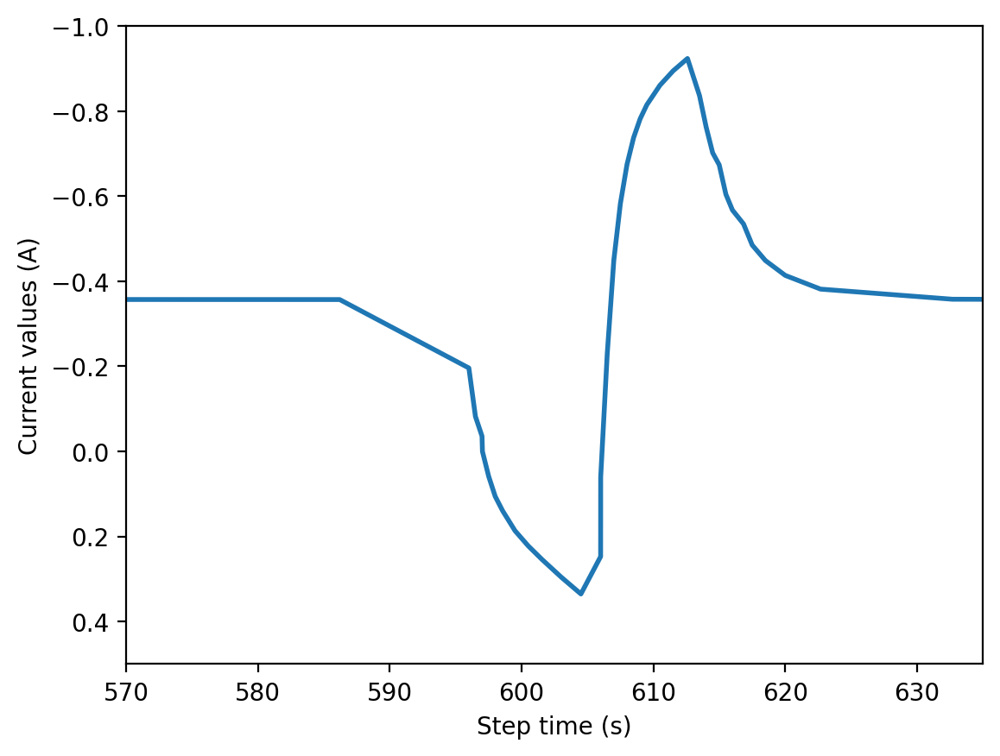

...

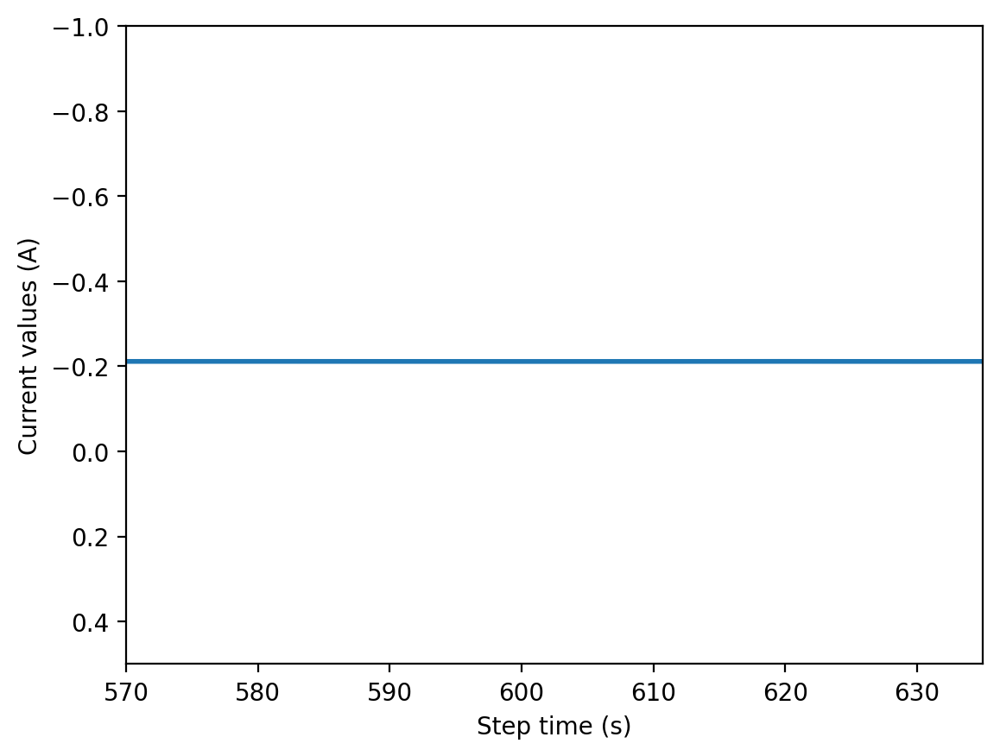

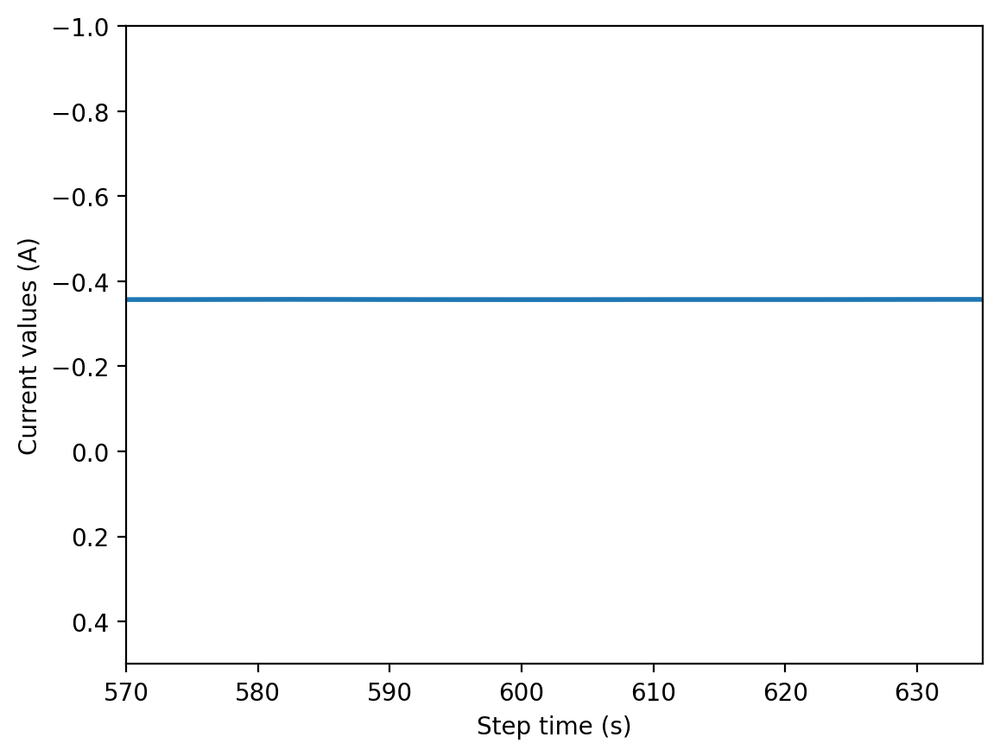

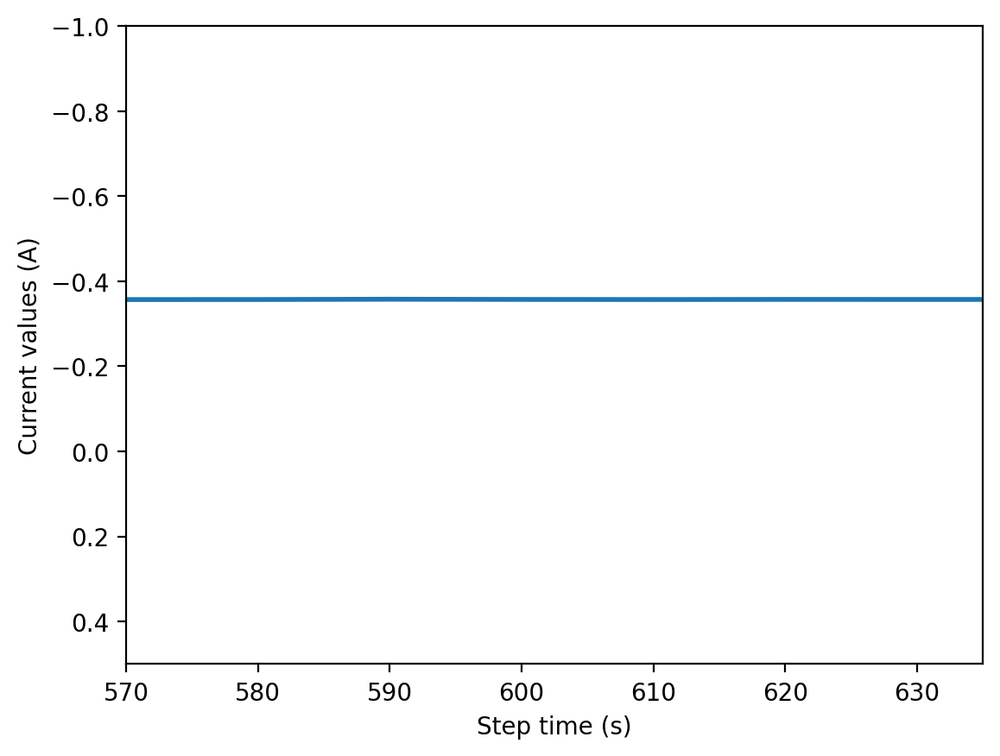

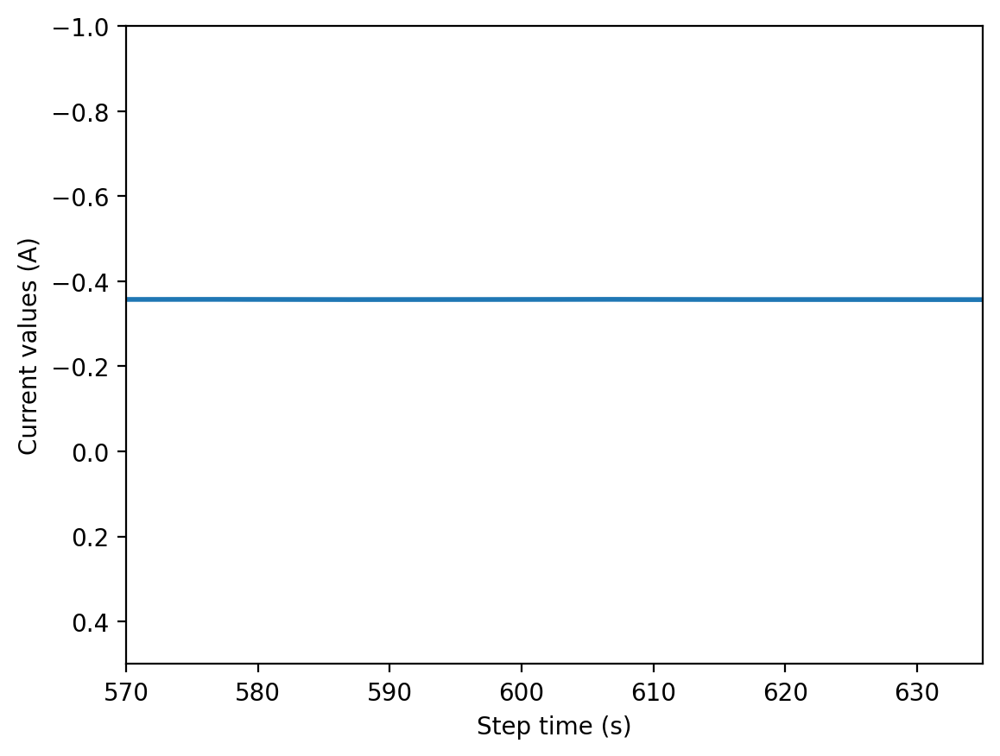

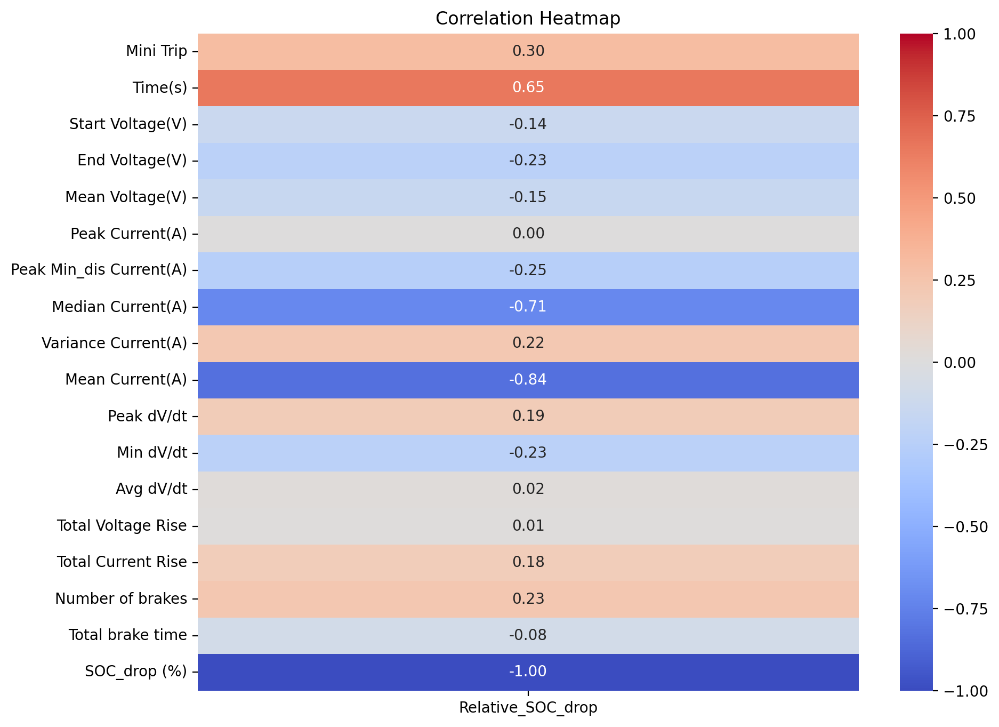

/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/3217211228.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data1['Classification'].iloc[mt]= 'def_Up'
/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/32172

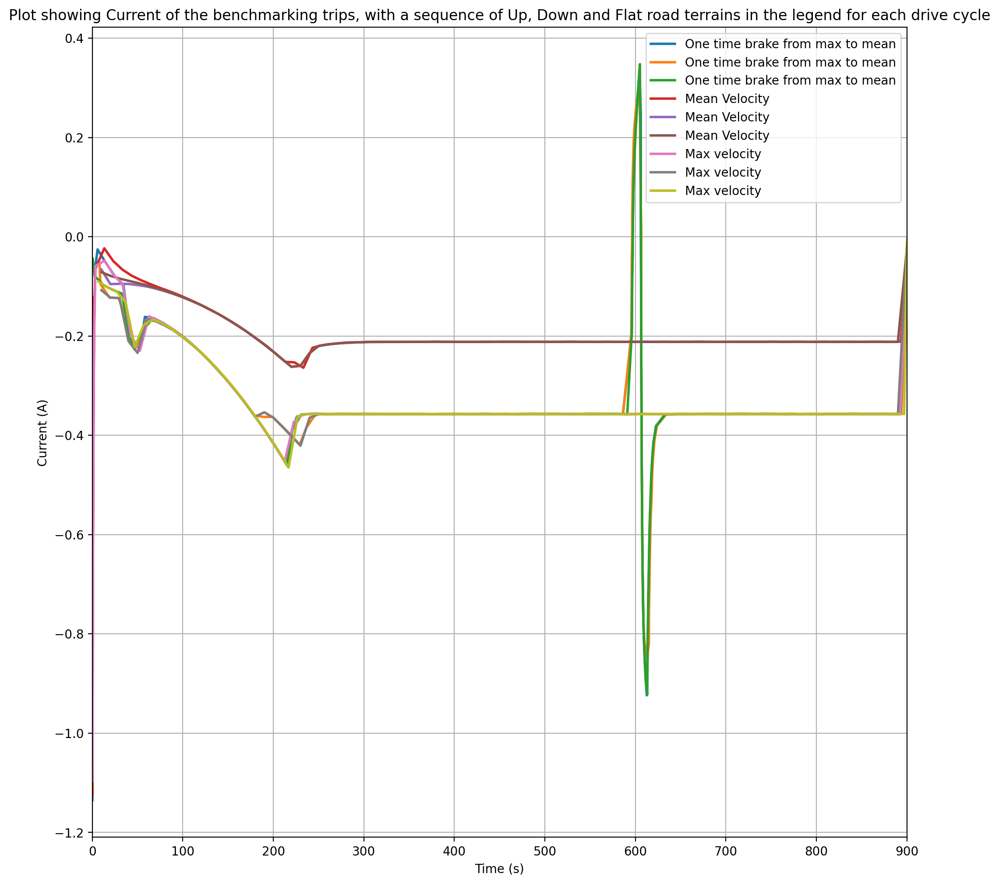

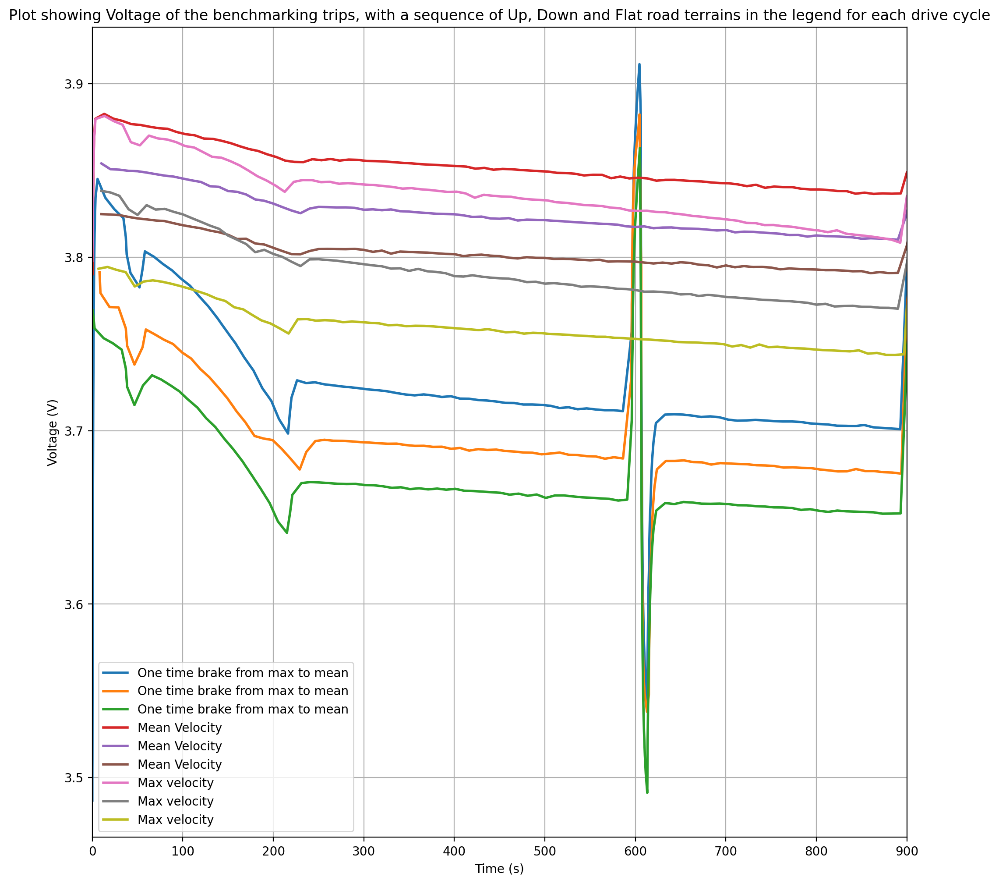

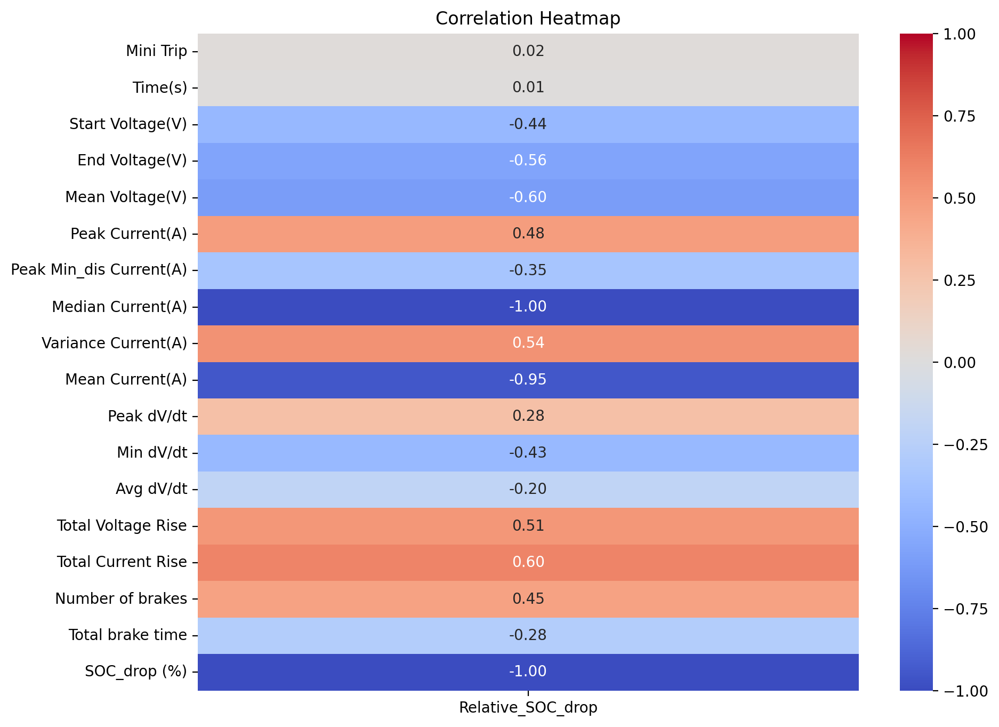

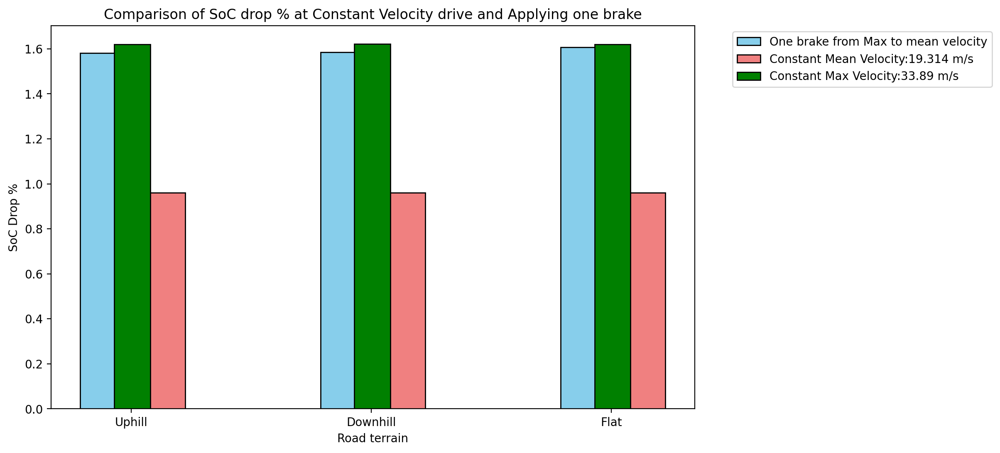

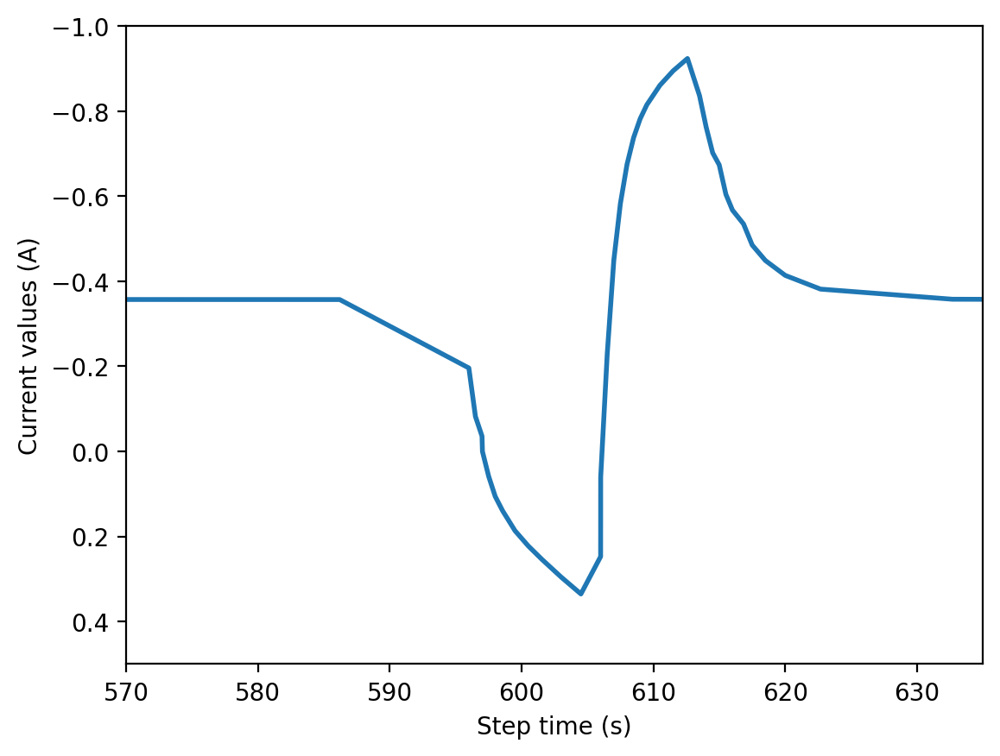

...

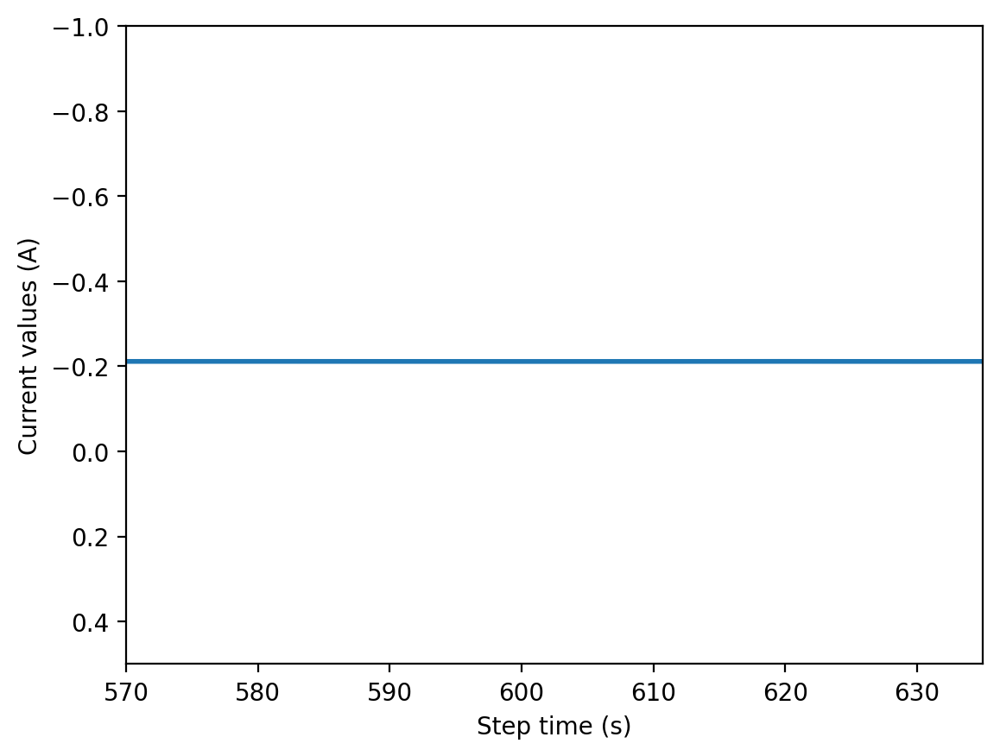

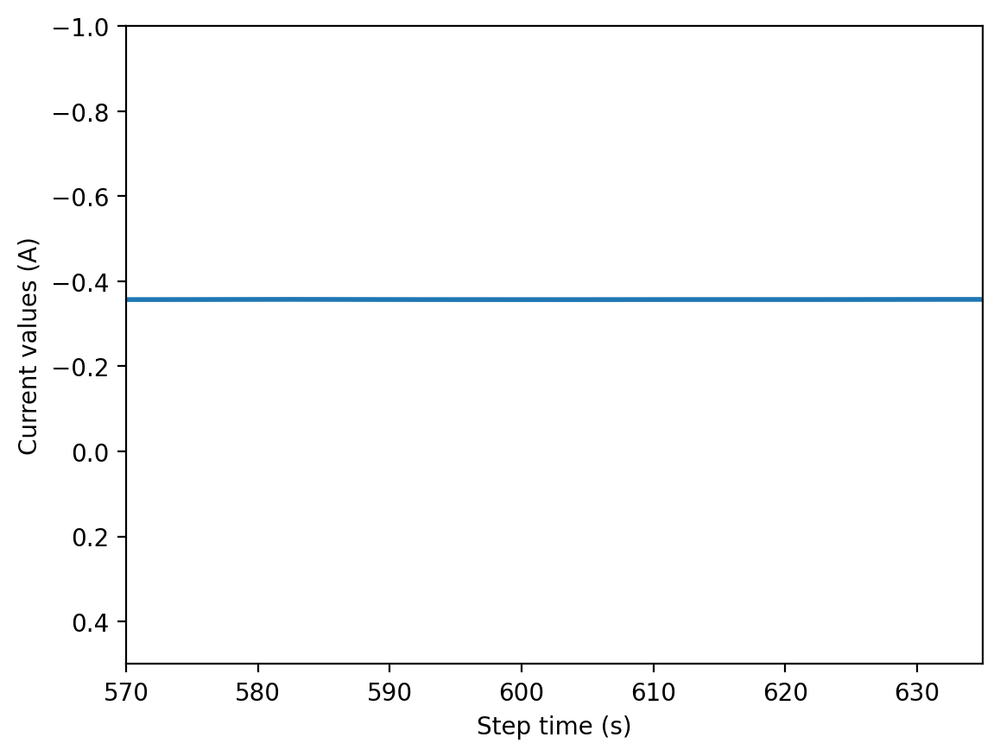

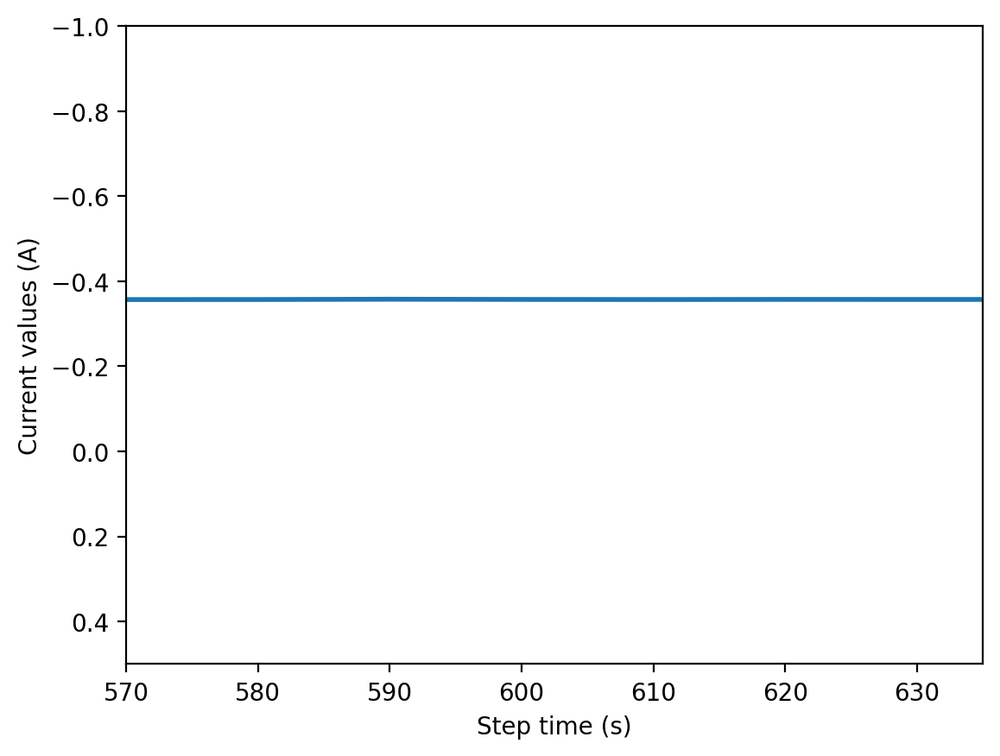

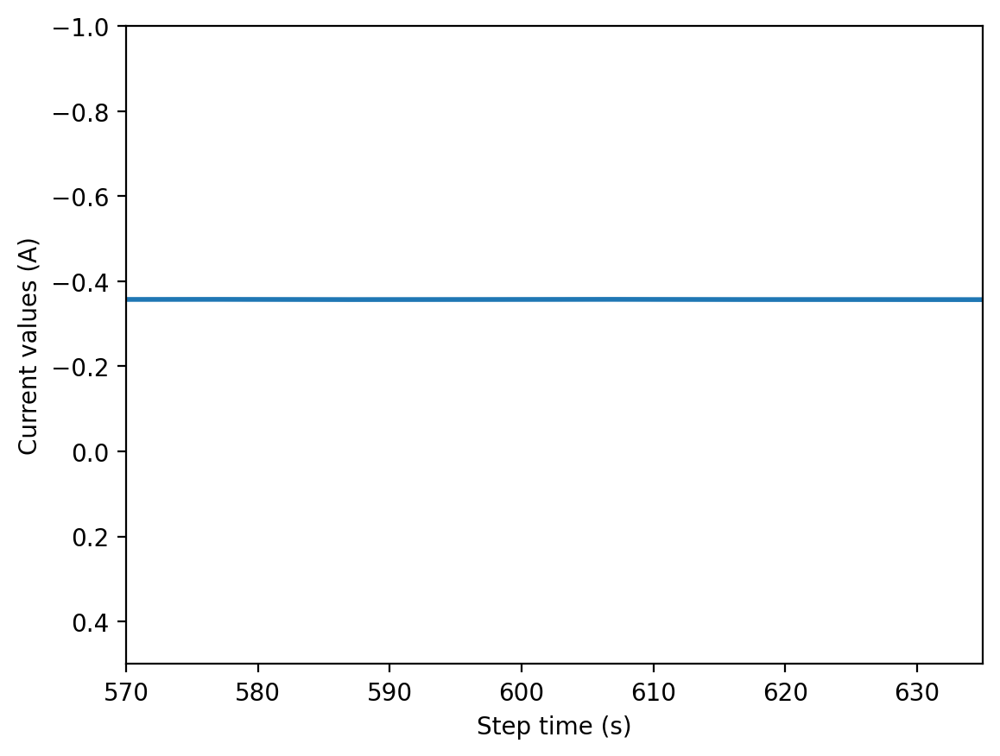

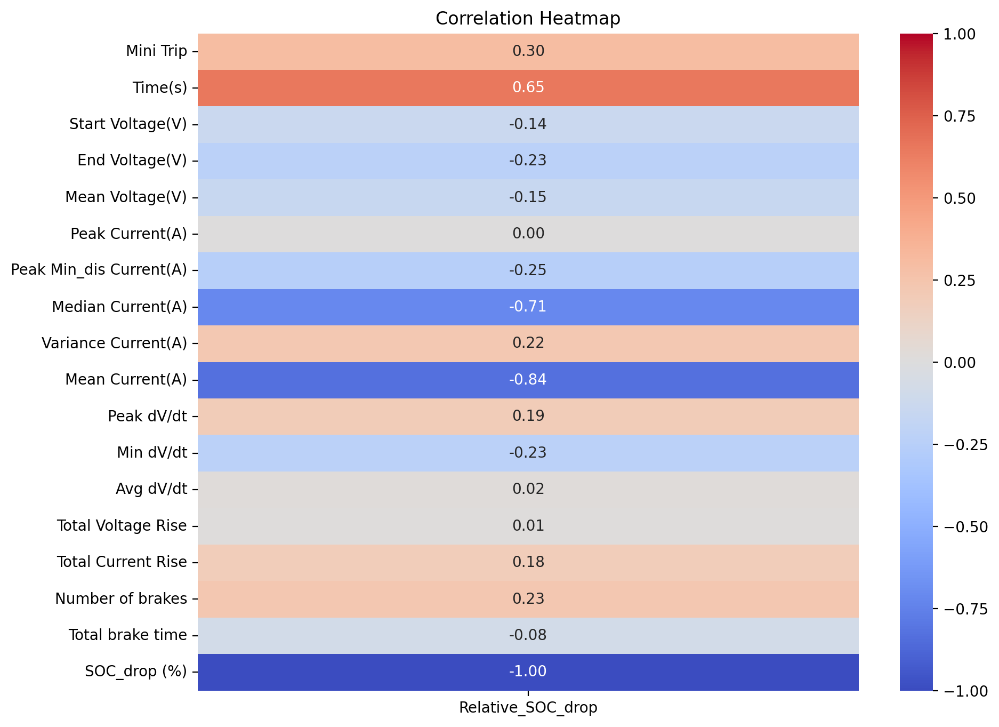

/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/3217211228.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data1['Classification'].iloc[mt]= 'def_Up'
/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/32172

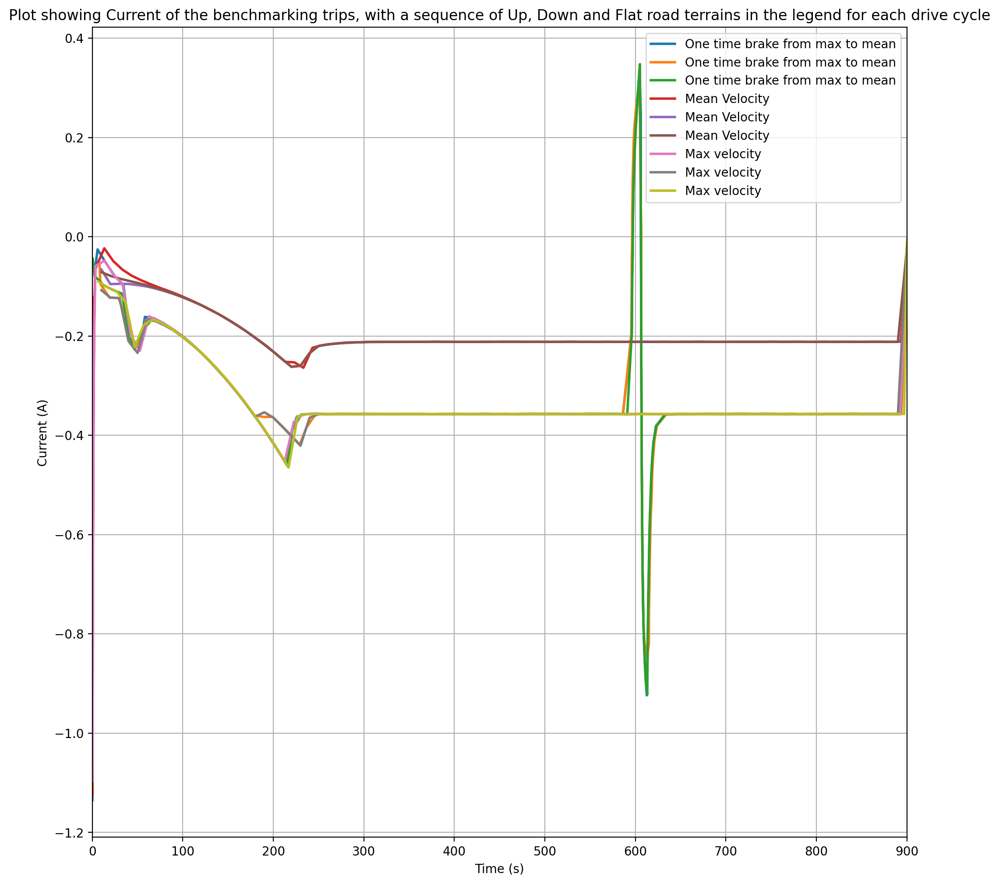

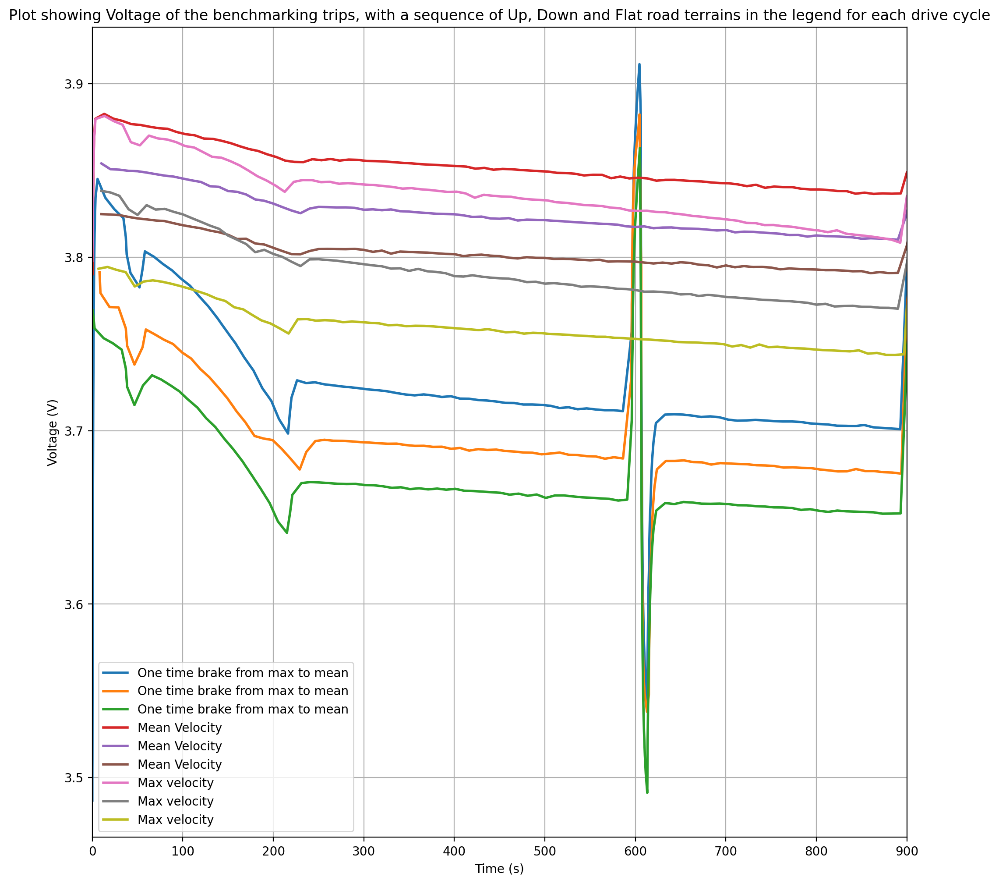

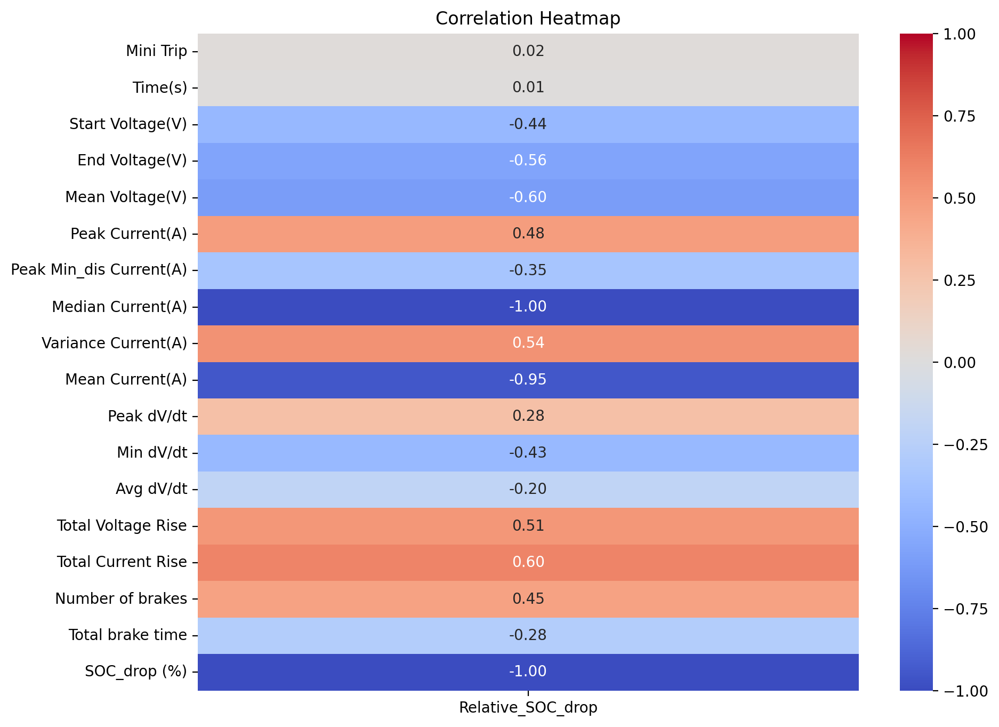

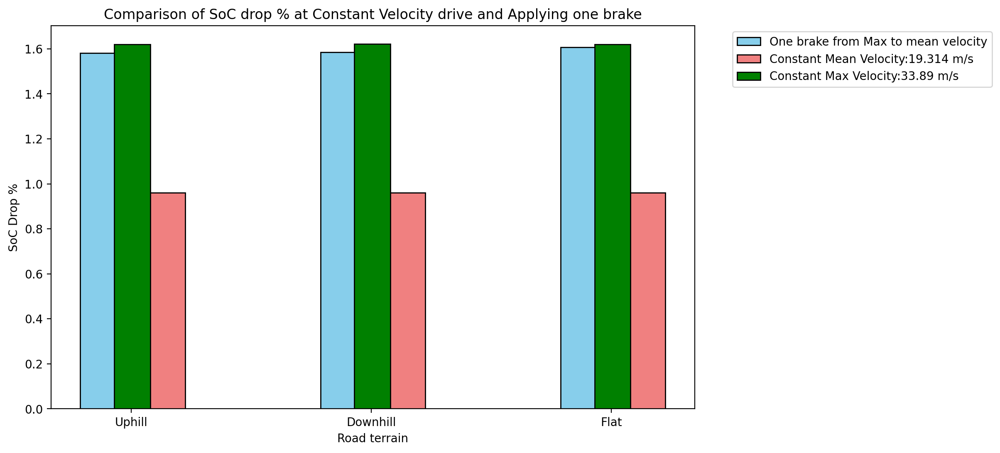

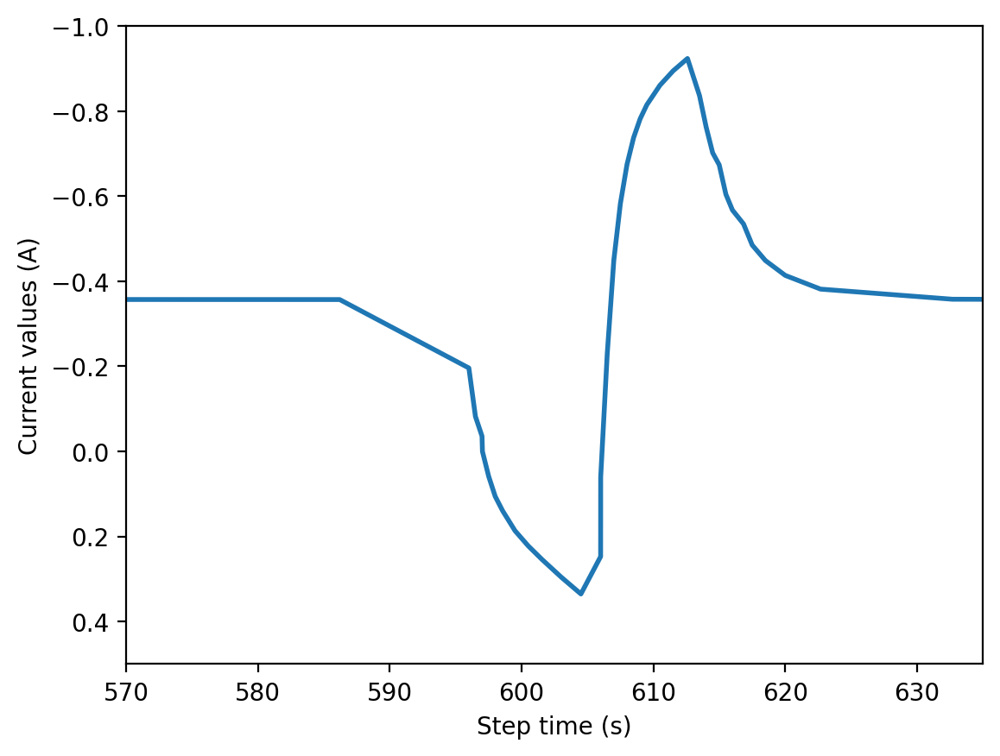

...

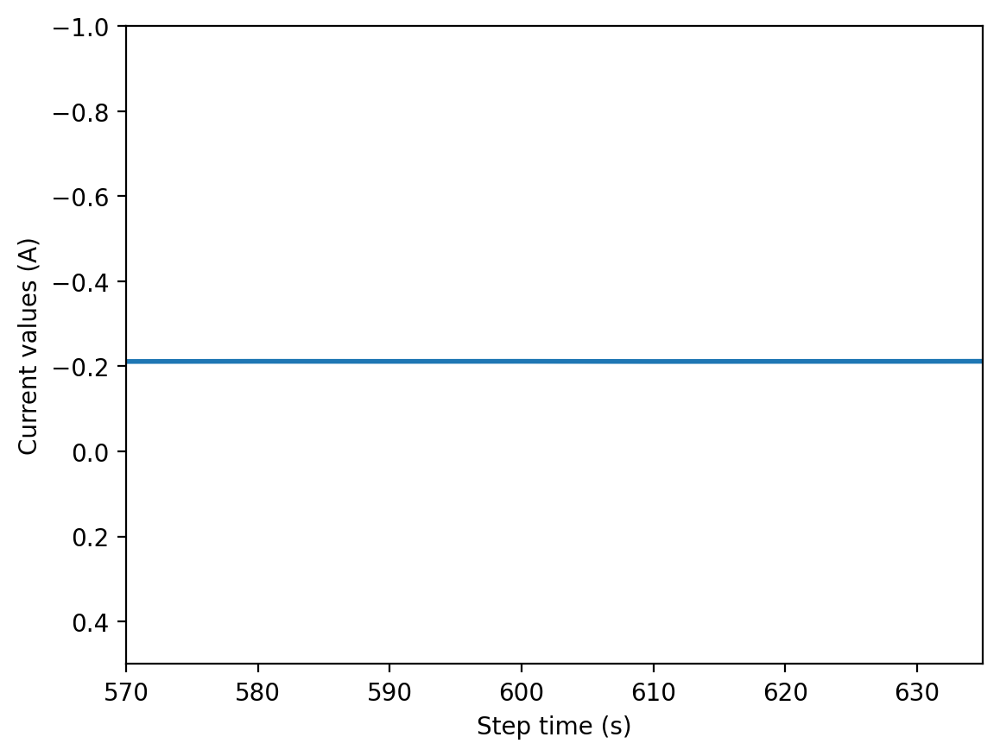

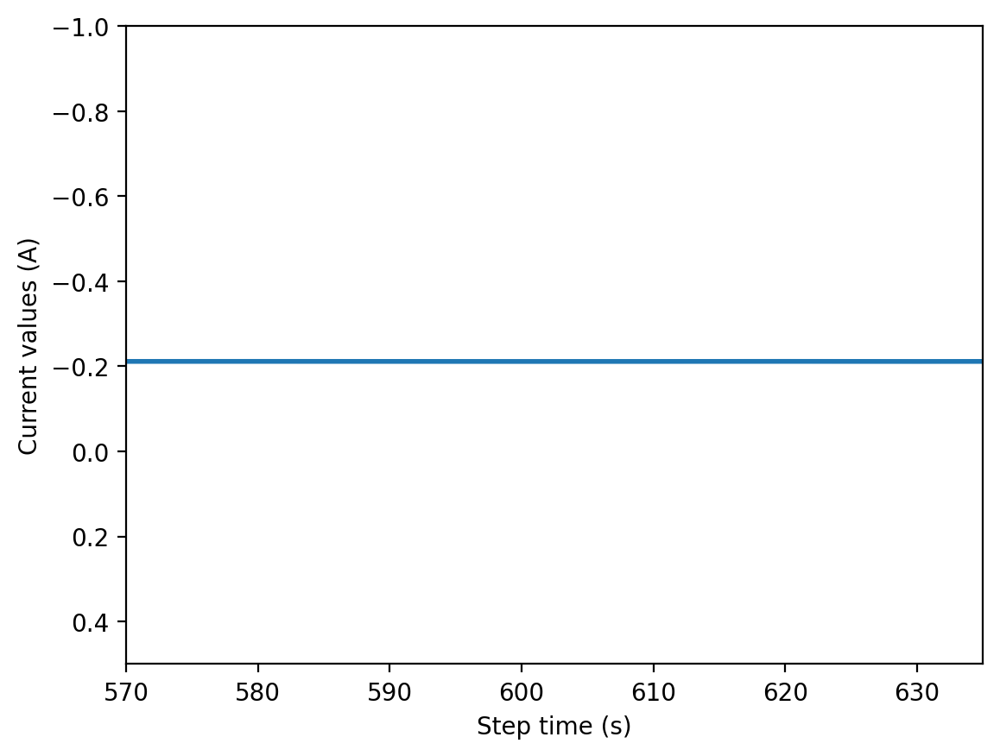

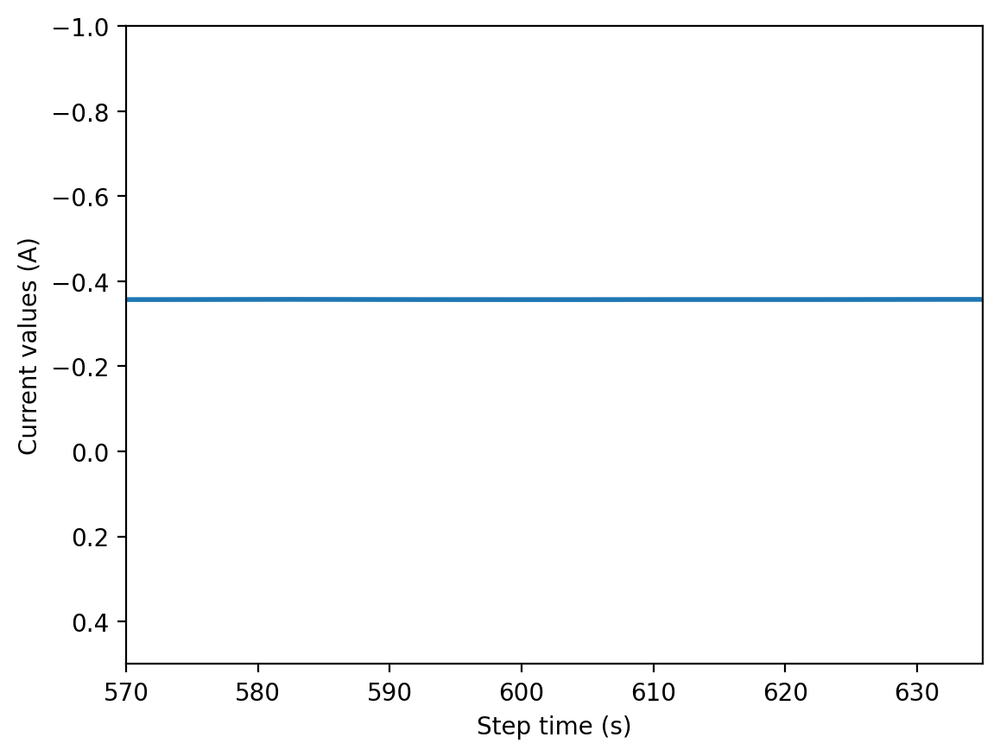

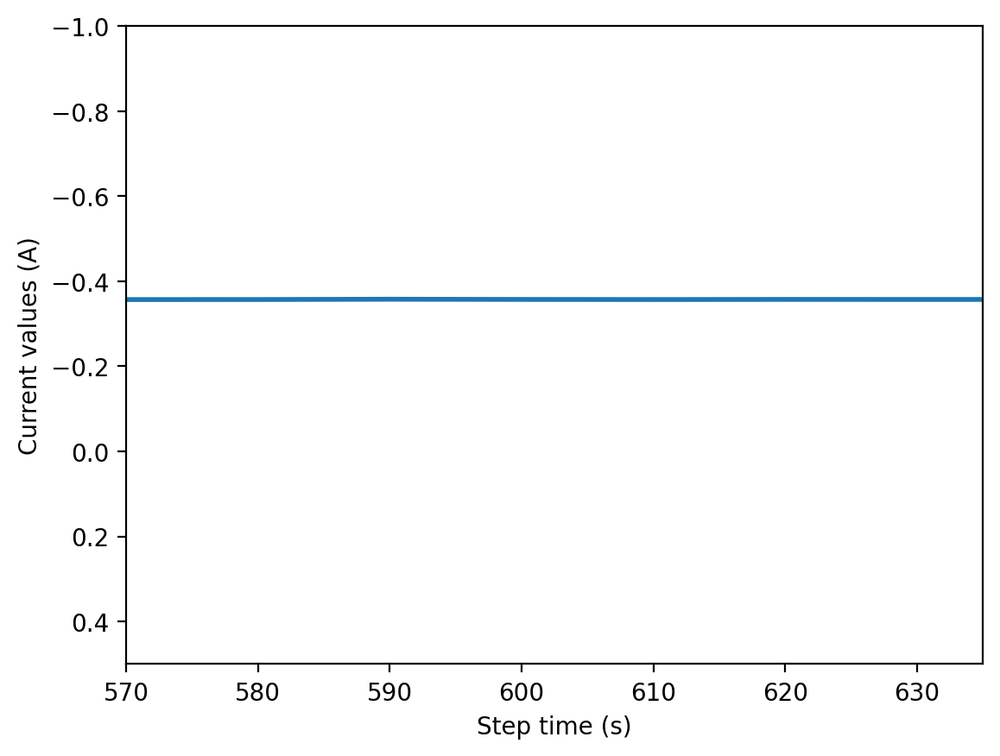

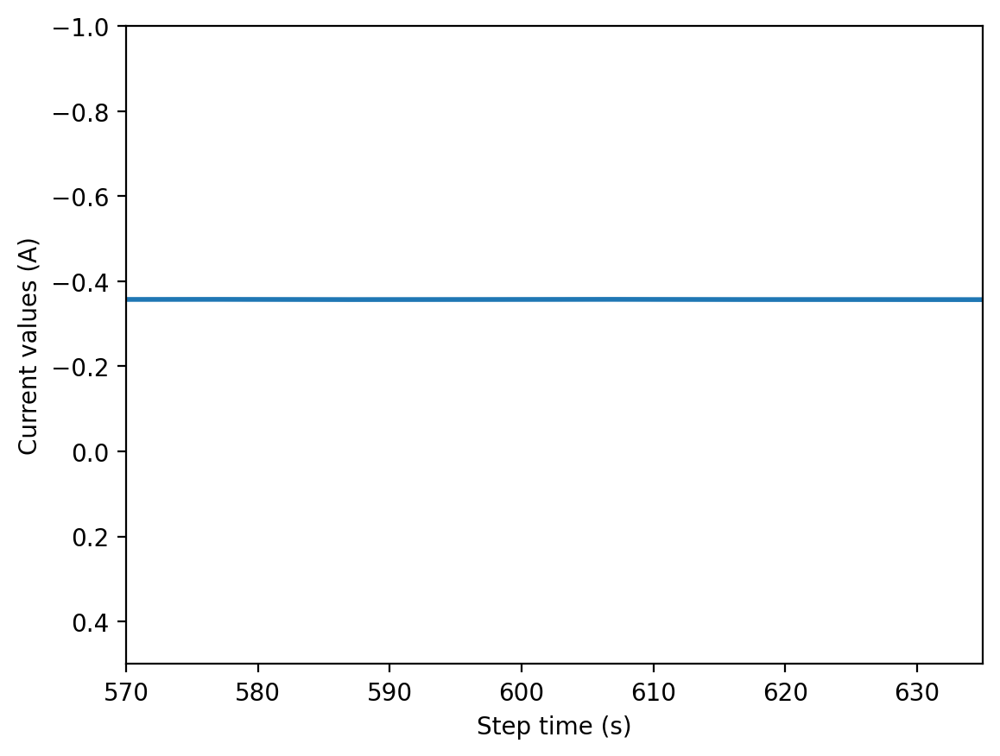

In [3]:
%run Database_create.ipynb
%run Hemanth_loop_updated.ipynb

##### Training data

In [4]:
rel_soc_array

[-0.13229649408555544,
 -0.2976534474760185,
 -0.6283966251697222,
 -0.9591572357125927,
 -1.28986870146,
 -1.6206225461921293]

In [5]:
classification_train_path = 'Classification_features_train.txt'
classification_train = pd.DataFrame(
    np.loadtxt(classification_train_path, delimiter=',', skiprows=1),
    columns=['Defensive driving style',
             'Assertive driving style',
            'Downhill terrain', 
            'Flat plane terrain', 
            'Uphill terrain',
            'Charge & no rest (a)',
            'No charge & no rest (b)',
            'No charge & no rest (c)',
            'No charge & no rest (d)',
            'Charge & rest (a)',
            'Charge & rest (b)',
            'Charge & rest (c)',
            'Cell ID (a)',
            'Cell ID (b)',
            'Cell ID (c)'])

In [5]:
classification_train.iloc[25:50]

,Defensive driving style,Assertive driving style,Downhill terrain,Flat plane terrain,Uphill terrain,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
25,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
26,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
27,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
28,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
29,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
30,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
31,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
32,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
33,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
34,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [6]:
# assertive_drive_cycles = [13, 17, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 42, 43, 44, 46, 47, 61, 65, 69, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 90, 91, 92, 94, 95]
# defensive_drive_cycles = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 37, 41, 45, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 62, 63, 64, 66, 67, 68, 70, 71, 85, 89, 93]

# classification_train.loc[assertive_drive_cycles, 'Assertive driving style'] = 1.0
# classification_train.loc[defensive_drive_cycles, 'Defensive driving style'] = 1.0

In [7]:
cut_dict_350 = {}
data_list_350 = []

for key in dict.keys():
    datafr_350 = cut_time(dict[key], 300, 350)
    data_list_350.append(datafr_350)

cut_dict_350 = {f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_350)}
cut_data_350 = features_ext(cut_dict_350)
cut_data_350['Charge Usage score 350'] = cut_data_350['SOC_drop (%)']/rel_soc_array[0]
cut_data_350 = cut_data_350.drop(columns='Relative_SOC_drop', axis =1)

cut_data_350_with_classification = pd.concat(
    [cut_data_350.reset_index(drop=True), classification_train.reset_index(drop=True)],
    axis=1)

cut_data_350_with_classification

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,40.0021,3.853367,3.840435,3.847643,-0.315498,-0.358489,-0.333096,0.000304,-0.334778,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,34.5564,3.825440,3.828958,3.826971,-0.332344,-0.355217,-0.332639,0.000084,-0.336478,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3,36.0347,3.836214,3.820742,3.821352,-0.247821,-0.306373,-0.298523,0.000357,-0.291893,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,4,32.9814,3.797720,3.808939,3.804083,-0.296925,-0.345615,-0.306589,0.000308,-0.310870,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,5,42.4806,3.796045,3.789937,3.792646,-0.295346,-0.321400,-0.314471,0.000098,-0.312283,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,92,43.5120,3.755281,3.766108,3.760713,-0.286446,-0.450002,-0.320795,0.004907,-0.349008,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
92,93,39.1444,3.740973,3.727139,3.731356,-0.334714,-0.368091,-0.357475,0.000142,-0.354350,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
93,94,40.9557,3.703782,3.619632,3.692257,-0.199769,-0.513600,-0.267631,0.013640,-0.313340,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
94,95,43.4347,3.688385,3.706670,3.711750,-0.161506,-0.293228,-0.220985,0.001869,-0.224417,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [8]:
cut_dict_400 = {}
data_list_400 = []

for key in dict.keys():
    datafr_400 = cut_time(dict[key], 300, 400)
    data_list_400.append(datafr_400)

cut_dict_400 = {f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_400)}
cut_data_400 = features_ext(cut_dict_400)
cut_data_400['Charge Usage score 400'] = cut_data_400['SOC_drop (%)']/rel_soc_array[1]
cut_data_400 = cut_data_400.drop(columns= ['Relative_SOC_drop', 'Charge Usage score 350'], axis =1)

cut_data_400_with_classification = pd.concat(
    [cut_data_400.reset_index(drop=True), classification_train.reset_index(drop=True)],
    axis=1)

cut_data_400_with_classification

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,92.3408,3.853367,3.845118,3.843591,-0.315498,-0.371565,-0.335647,0.000248,-0.338904,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,84.5587,3.825440,3.827247,3.827539,-0.332344,-0.355217,-0.332749,0.000045,-0.335135,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3,88.2715,3.836214,3.848385,3.826832,-0.195192,-0.310548,-0.296038,0.001442,-0.274166,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,4,87.7146,3.797720,3.812878,3.806539,-0.278081,-0.345615,-0.289021,0.000277,-0.296097,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,5,92.4835,3.796045,3.795833,3.793357,-0.291863,-0.329984,-0.307145,0.000182,-0.307670,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,92,90.3563,3.755281,3.768725,3.765908,-0.149262,-0.450002,-0.286446,0.008132,-0.288566,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
92,93,89.1474,3.740973,3.739816,3.732803,-0.322103,-0.368091,-0.354461,0.000243,-0.348178,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
93,94,86.3346,3.703782,3.688422,3.639565,-0.199769,-0.818060,-0.469704,0.034333,-0.489068,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
94,95,91.9329,3.688385,3.685338,3.699056,-0.161506,-0.328556,-0.276060,0.002671,-0.260739,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [9]:
cut_dict_500 = {}
data_list_500 = []

for key in dict.keys():
    datafr_500 = cut_time(dict[key], 300, 500)
    data_list_500.append(datafr_500)

cut_dict_500 = {f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_500)}
cut_data_500 = features_ext(cut_dict_500)
cut_data_500['Charge Usage score 500'] = cut_data_500['SOC_drop (%)']/rel_soc_array[2]
cut_data_500 = cut_data_500.drop(columns=['Relative_SOC_drop', 'Charge Usage score 350',  'Charge Usage score 400'], axis =1)

cut_data_500_with_classification = pd.concat(
    [cut_data_500.reset_index(drop=True), classification_train.reset_index(drop=True)],
    axis=1)

cut_data_500_with_classification

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,191.4182,3.853367,3.859400,3.851436,-0.160354,-0.371565,-0.321711,0.002868,-0.303686,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,188.9158,3.825440,3.833646,3.831384,-0.182461,-0.355217,-0.332548,0.001739,-0.310836,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3,192.8358,3.836214,3.827756,3.831369,-0.178817,-0.310548,-0.254481,0.001627,-0.255255,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,4,184.4134,3.797720,3.812928,3.805397,-0.223990,-0.368736,-0.292896,0.001080,-0.298884,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,5,191.7214,3.796045,3.800097,3.797440,-0.168034,-0.329984,-0.290221,0.001440,-0.282558,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,92,194.9879,3.755281,3.758526,3.762640,-0.149262,-0.450002,-0.322412,0.005370,-0.310086,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
92,93,190.3109,3.740973,3.726331,3.740686,-0.268022,-0.368091,-0.322060,0.001256,-0.315200,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
93,94,186.0979,3.703782,3.684448,3.655199,-0.199769,-0.818060,-0.357832,0.026050,-0.443002,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
94,95,192.4436,3.688385,3.690798,3.696031,-0.161506,-0.328556,-0.274427,0.001666,-0.265674,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [10]:
cut_dict_600 = {}
data_list_600 = []

for key in dict.keys():
    datafr_600 = cut_time(dict[key], 300, 600)
    data_list_600.append(datafr_600)

cut_dict_600 = {f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_600)}
cut_data_600 = features_ext(cut_dict_600)
cut_data_600['Charge Usage score 600'] = cut_data_600['SOC_drop (%)']/rel_soc_array[3]
cut_data_600 = cut_data_600.drop(columns=['Relative_SOC_drop', 'Charge Usage score 350',  'Charge Usage score 400', 'Charge Usage score 500'], axis =1)

cut_data_600_with_classification = pd.concat(
    [cut_data_600.reset_index(drop=True), classification_train.reset_index(drop=True)],
    axis=1)

cut_data_600_with_classification

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,293.1234,3.853367,3.899720,3.859448,-0.107182,-0.371565,-0.284360,0.006136,-0.268384,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,288.3840,3.825440,3.811513,3.828187,-0.182461,-0.371942,-0.332749,0.001591,-0.319587,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3,293.6487,3.836214,3.807981,3.826373,-0.178817,-0.327917,-0.277916,0.001599,-0.269765,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,4,285.9081,3.797720,3.785812,3.795784,-0.223990,-0.537201,-0.304644,0.005078,-0.330124,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,5,290.2106,3.796045,3.837159,3.801260,-0.115632,-0.329984,-0.285279,0.002909,-0.261864,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,92,293.0209,3.755281,3.755457,3.762700,-0.123577,-0.450002,-0.322134,0.005503,-0.294549,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
92,93,284.6601,3.740973,3.740031,3.735164,-0.268022,-0.414481,-0.328420,0.001639,-0.325549,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
93,94,285.4527,3.703782,3.695551,3.661586,-0.199769,-0.818060,-0.357532,0.021512,-0.421733,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
94,95,289.3263,3.688385,3.734435,3.683663,-0.133978,-0.533918,-0.280362,0.008451,-0.298243,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [11]:
cut_dict_700 = {}
data_list_700 = []

for key in dict.keys():
    datafr_700 = cut_time(dict[key], 300, 700)
    data_list_700.append(datafr_700)

cut_dict_700 = {f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_700)}
cut_data_700 = features_ext(cut_dict_700)
cut_data_700['Charge Usage score 700'] = cut_data_700['SOC_drop (%)']/rel_soc_array[4]
cut_data_700 = cut_data_700.drop(columns=['Relative_SOC_drop', 'Charge Usage score 350',  'Charge Usage score 400', 'Charge Usage score 500', 'Charge Usage score 600'], axis =1)

cut_data_700_with_classification = pd.concat(
    [cut_data_700.reset_index(drop=True), classification_train.reset_index(drop=True)],
    axis=1)

cut_data_700_with_classification

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,392.9196,3.853367,3.840640,3.868323,-0.029862,-0.371565,-0.260011,0.009878,-0.233038,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,388.5218,3.825440,3.812049,3.823998,-0.182461,-0.379497,-0.336712,0.001504,-0.329174,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3,393.6515,3.836214,3.808740,3.821859,-0.178817,-0.359104,-0.295083,0.002110,-0.284028,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,4,385.7115,3.797720,3.804272,3.795513,-0.223990,-0.537201,-0.304644,0.004378,-0.324938,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,5,396.9701,3.796045,3.775873,3.807767,-0.024798,-0.344341,-0.268869,0.007846,-0.233715,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,92,393.0268,3.755281,3.752217,3.761028,-0.123577,-0.450002,-0.322412,0.004523,-0.298485,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
92,93,384.1347,3.740973,3.713910,3.723049,-0.268022,-0.568212,-0.341083,0.005499,-0.350610,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
93,94,384.0611,3.703782,3.703224,3.667576,-0.199769,-0.818060,-0.357464,0.020241,-0.401155,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
94,95,390.4401,3.688385,3.667846,3.683335,-0.107694,-0.533918,-0.292543,0.008123,-0.296319,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [12]:
cut_dict_800 = {}
data_list_800 = []

for key in dict.keys():
    datafr_800 = cut_time(dict[key], 300, 800)
    data_list_800.append(datafr_800)

cut_dict_800 = {f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_800)}
cut_data_800 = features_ext(cut_dict_800)
cut_data_800['Charge Usage score 800'] = cut_data_800['SOC_drop (%)']/rel_soc_array[5]
cut_data_800 = cut_data_800.drop(columns=['Relative_SOC_drop', 'Charge Usage score 350',  'Charge Usage score 400', 'Charge Usage score 500', 'Charge Usage score 600', 'Charge Usage score 700'], axis =1)

cut_data_800_with_classification = pd.concat(
    [cut_data_800.reset_index(drop=True), classification_train.reset_index(drop=True)],
    axis=1)

cut_data_800_with_classification

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,498.2785,3.853367,3.846318,3.861675,-0.029862,-0.371565,-0.290050,0.009414,-0.253142,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,482.1791,3.825440,3.809607,3.821051,-0.182461,-0.379497,-0.339989,0.001335,-0.334662,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3,494.4990,3.836214,3.813374,3.819919,-0.178817,-0.359104,-0.295083,0.001730,-0.286618,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,4,489.5848,3.797720,3.769630,3.795607,-0.223990,-0.537201,-0.301091,0.003937,-0.320272,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,5,496.6855,3.796045,3.792684,3.802303,-0.024798,-0.385378,-0.280622,0.007163,-0.248240,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,92,496.5359,3.755281,3.754886,3.760149,-0.123577,-0.450002,-0.294712,0.004241,-0.292415,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
92,93,487.6598,3.740973,3.717616,3.723380,-0.218840,-0.568212,-0.332925,0.005091,-0.342327,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
93,94,491.2119,3.703782,3.698575,3.677905,-0.166904,-0.818060,-0.357337,0.021922,-0.365208,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
94,95,484.1548,3.688385,3.656023,3.678666,-0.107694,-0.533918,-0.298938,0.007495,-0.307075,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [13]:
print(cut_data_350_with_classification['SOC_drop (%)'])
print(cut_data_400_with_classification['SOC_drop (%)'])
print(cut_data_500_with_classification['SOC_drop (%)'])
print(cut_data_600_with_classification['SOC_drop (%)'])
print(cut_data_700_with_classification['SOC_drop (%)'])
print(cut_data_800_with_classification['SOC_drop (%)'])

0    -0.125784
1    -0.106497
2    -0.099909
3    -0.092394
4    -0.121169
        ...   
91   -0.134525
92   -0.129575
93   -0.093126
94   -0.081837
95   -0.156825
Name: SOC_drop (%), Length: 96, dtype: float64
0    -0.292466
1    -0.260913
2    -0.220473
3    -0.236982
4    -0.260628
        ...   
91   -0.228402
92   -0.287349
93   -0.278883
94   -0.218638
95   -0.241344
Name: SOC_drop (%), Length: 96, dtype: float64
0    -0.554184
1    -0.555183
2    -0.443613
3    -0.506081
4    -0.502381
        ...   
91   -0.547961
92   -0.560942
93   -0.609085
94   -0.467110
95   -0.611981
Name: SOC_drop (%), Length: 96, dtype: float64
0    -0.750157
1    -0.869357
2    -0.724684
3    -0.830975
4    -0.691426
        ...   
91   -0.785161
92   -0.866461
93   -0.932019
94   -0.722576
95   -0.846804
Name: SOC_drop (%), Length: 96, dtype: float64
0    -0.873508
1    -1.203167
2    -1.039187
3    -1.111688
4    -0.827553
        ...   
91   -1.073215
92   -1.183439
93   -1.200368
94   -1.020374
95

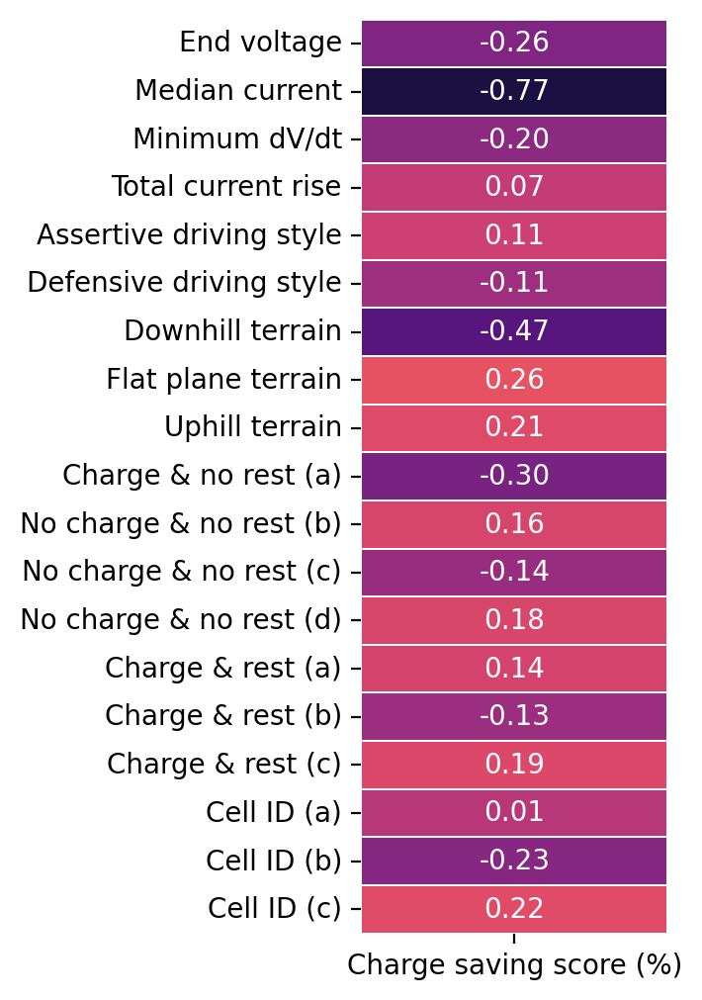

In [14]:
corr_matrix = cut_data_800_with_classification.corr()
target_corr = corr_matrix[["Charge Usage score 800"]].drop(["Charge Usage score 800"])
target_corr_renamed = target_corr.rename(columns={"Charge Usage score 800": "Charge Usage score (%)"})
feature_name_mapping = {
    'End Voltage(V)': 'End voltage',
    'Median Current(A)': 'Median current',
    'Min dV/dt': 'Minimum dV/dt',
    'Total Current Rise': 'Total current rise'
}

features_selected = ['End voltage', 'Median current', 'Minimum dV/dt', 'Total current rise', 'Assertive driving style',
       'Defensive driving style', 'Downhill terrain', 'Flat plane terrain',
       'Uphill terrain', 'Charge & no rest (a)', 'No charge & no rest (b)',
       'No charge & no rest (c)', 'No charge & no rest (d)',
       'Charge & rest (a)', 'Charge & rest (b)', 'Charge & rest (c)',
       'Cell ID (a)', 'Cell ID (b)', 'Cell ID (c)']

target_corr_renamed = target_corr_renamed.rename(index=feature_name_mapping)
features_selected_renamed = [feature_name_mapping.get(feature, feature) for feature in features_selected]
target_corr_filtered = target_corr_renamed.loc[features_selected_renamed]



plt.figure(figsize=(2, 6))
sns.heatmap(
    target_corr_filtered,
    annot=True,
    cmap="magma",
    fmt=".2f",
    vmin=-1,
    vmax=1,
    linewidths=0.01,
    annot_kws={"color": "white"},  
    cbar_kws={"label": "Correlation Coefficient"} , cbar = False
)

# plt.gcf().savefig('/Users/hemanthnr/Desktop/correlation_currentmodels.svg', format='svg', dpi=2000, bbox_inches='tight')
plt.show()

#### combined training data (features)

In [15]:
X_train = cut_data_350_with_classification.drop("Charge Usage score 350", axis=1)
X_train = X_train[['End Voltage(V)', 'Median Current(A)', 'Min dV/dt', 'Total Current Rise', 'Assertive driving style',
        'Defensive driving style',
        'Downhill terrain', 
        'Flat plane terrain', 
        'Uphill terrain',
        'Charge & no rest (a)',
        'No charge & no rest (b)',
        'No charge & no rest (c)',
        'No charge & no rest (d)',
        'Charge & rest (a)',
        'Charge & rest (b)',
        'Charge & rest (c)',
        'Cell ID (a)',
        'Cell ID (b)',
        'Cell ID (c)']]

#### combined training data (target)

In [16]:
y_train_350 = cut_data_350_with_classification["Charge Usage score 350"]
y_train_400 = cut_data_400_with_classification["Charge Usage score 400"]
y_train_500 = cut_data_500_with_classification["Charge Usage score 500"]
y_train_600 = cut_data_600_with_classification["Charge Usage score 600"]
y_train_700 = cut_data_700_with_classification["Charge Usagescore 700"]
y_train_800 = cut_data_800_with_classification["Charge Usage score 800"]

Y_train = 100 * pd.DataFrame({
    "Charge Usage score 350": y_train_350,
    "Charge Usage score 400": y_train_400,
    "Charge Usage score 500": y_train_500,
    "Charge Usage score 600": y_train_600,
    "Charge Usage score 700": y_train_700,
    "Charge Usage score 800": y_train_800,
})

In [17]:
classification_train['Assertive driving style'] == 1

0     False
1     False
2     False
3     False
4     False
      ...  
91     True
92     True
93     True
94     True
95     True
Name: Assertive driving style, Length: 96, dtype: bool

In [18]:
df = pd.concat([classification_train['Assertive driving style'], Y_train], axis=1)
df_1 = df[df['Assertive driving style'] == 1.0]
df_0 = df[df['Assertive driving style'] == 0.0]

In [19]:
df_0

,Assertive driving style,Charge saving score 350,Charge saving score 400,Charge saving score 500,Charge saving score 600,Charge saving score 700,Charge saving score 800
0,0.0,95.077191,98.257206,88.190198,78.210020,67.720704,73.491590
1,0.0,80.498544,87.656667,88.349067,90.637578,93.278279,93.370358
2,0.0,75.518956,74.070378,70.594385,75.554246,80.565357,81.185383
3,0.0,69.838697,79.616616,80.535361,86.635957,86.186114,86.134278
4,0.0,91.589338,87.560750,79.946516,72.086798,64.157949,68.566162
5,0.0,82.580941,88.319091,78.738099,81.277253,86.755494,89.520016
6,0.0,88.374624,68.968250,65.974053,71.003654,75.075564,75.389916
7,0.0,77.057516,75.563403,76.905866,83.688102,83.214016,82.333634
8,0.0,92.432814,94.870796,88.839335,77.944788,68.432548,73.383676
9,0.0,84.934399,89.654313,88.385880,89.611311,92.330709,94.639627


## Tetsing data

/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/3217211228.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data1['Classification'].iloc[mt]= 'def_Up'
/var/folders/bv/5yzv5x3d5sb44fl8wn3sdr540000gn/T/ipykernel_33661/32172

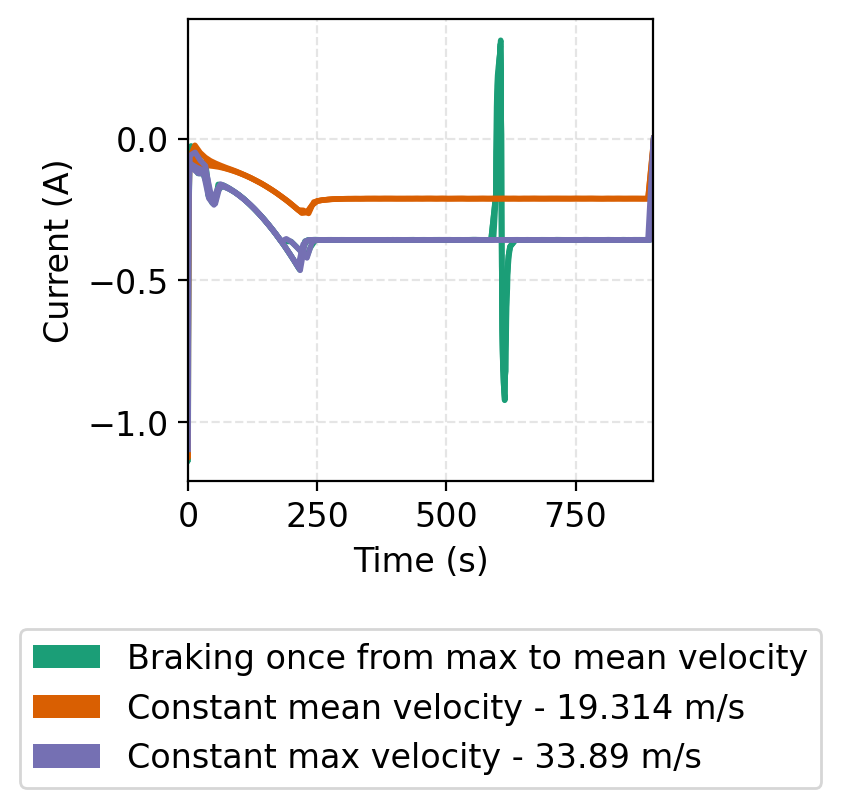

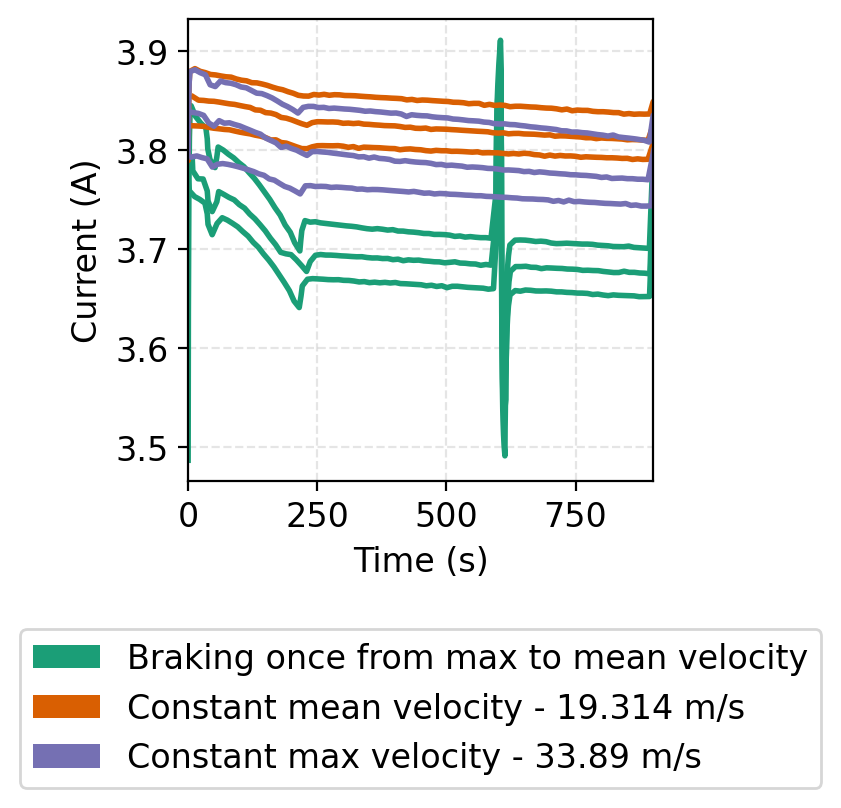

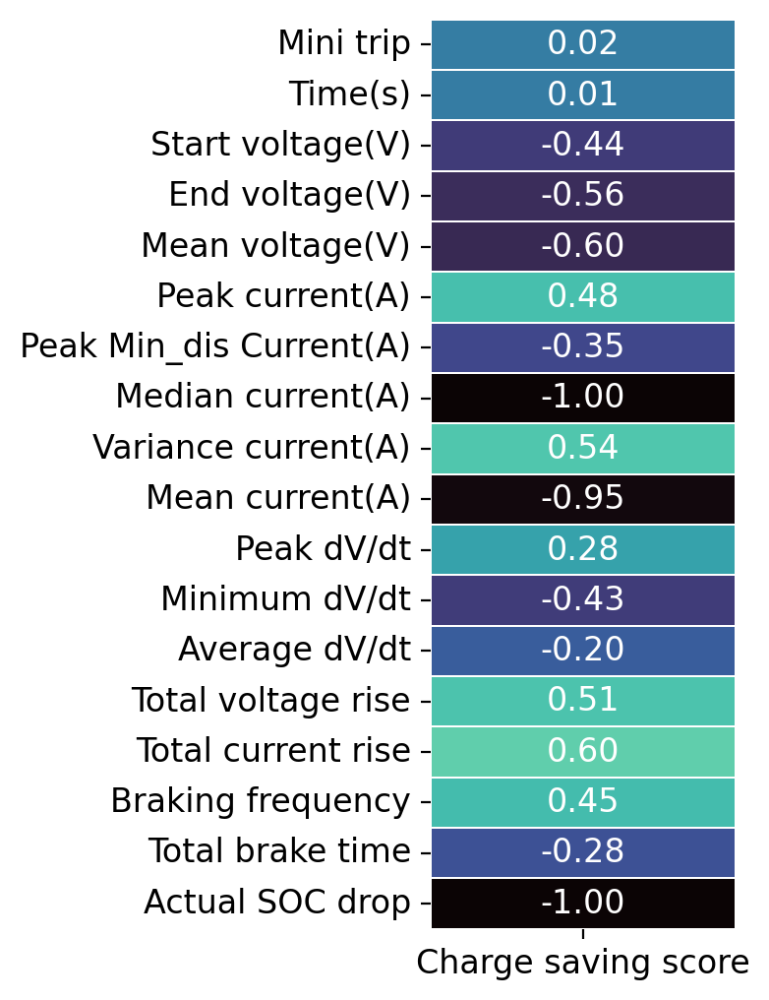

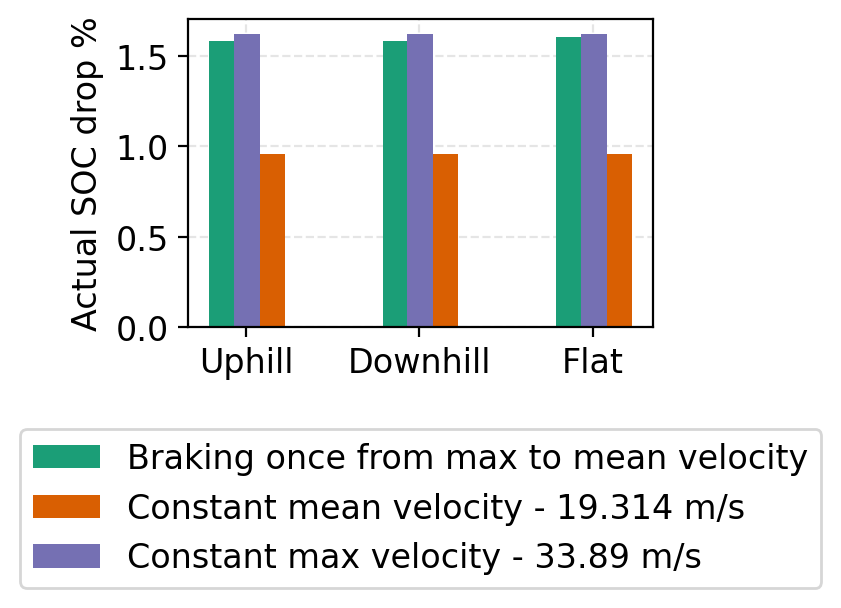

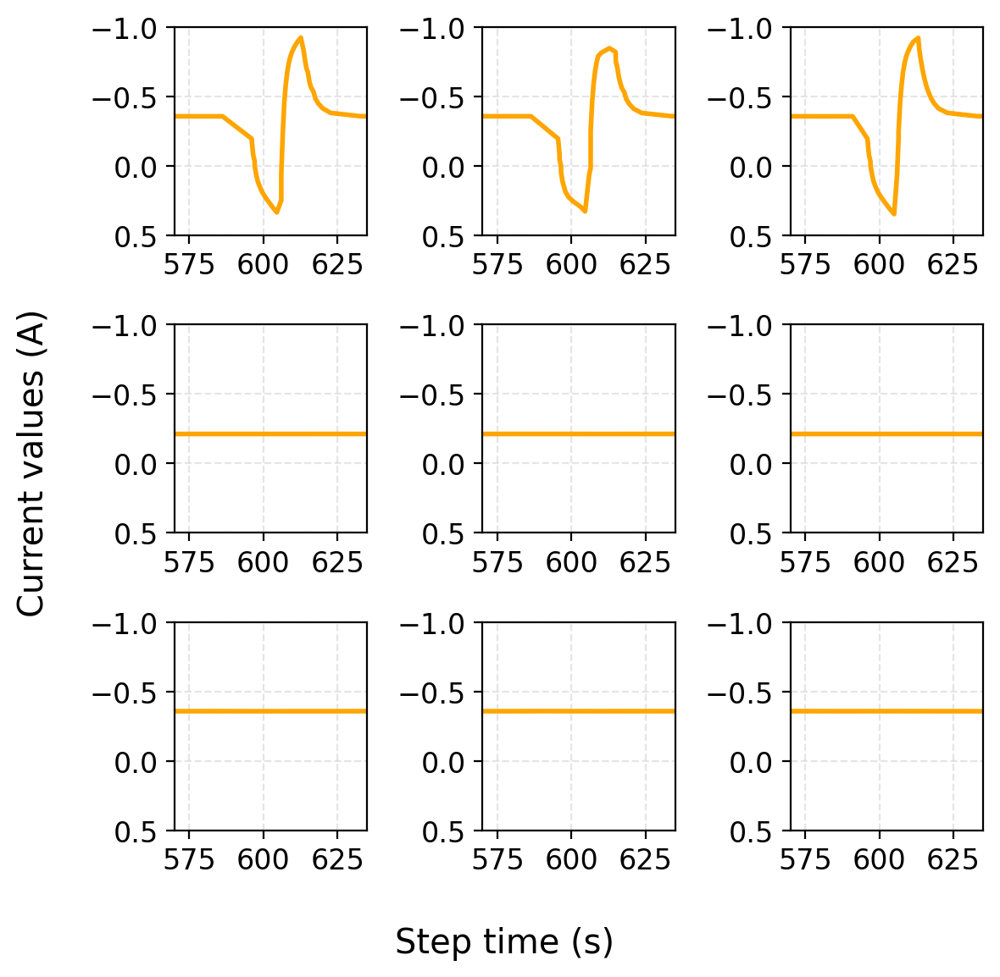

...

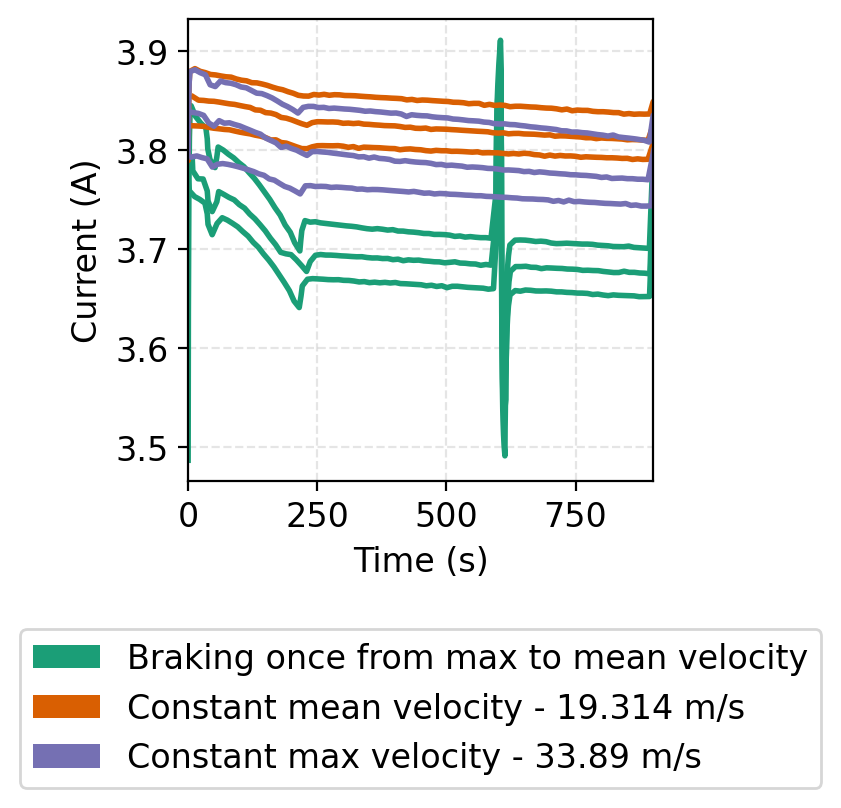

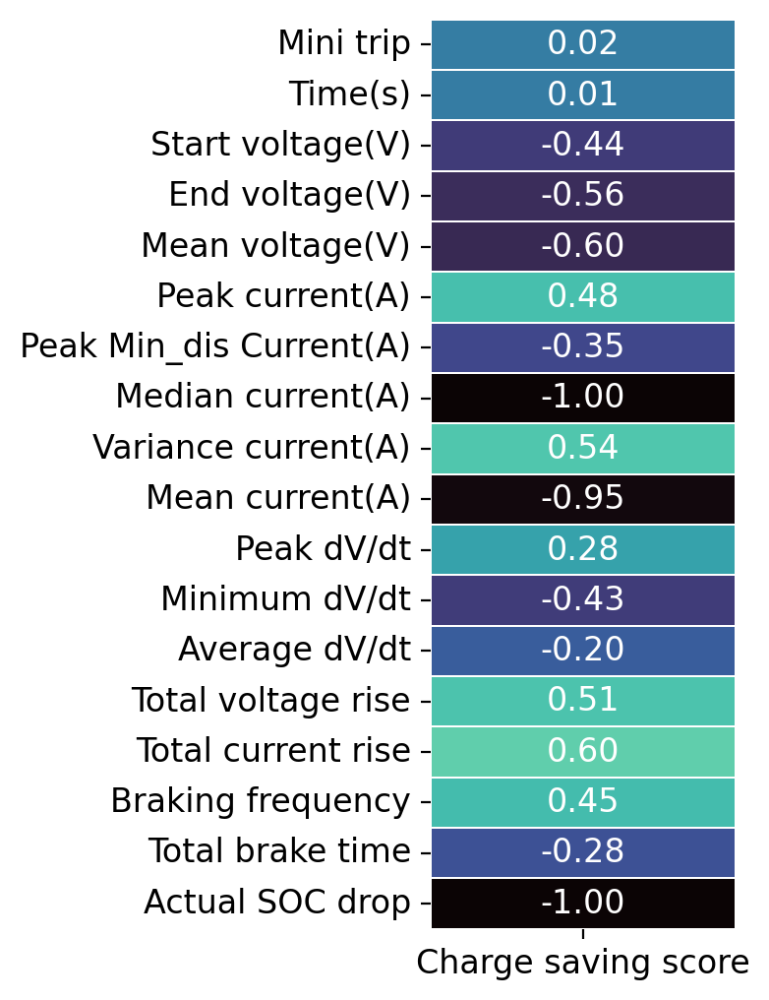

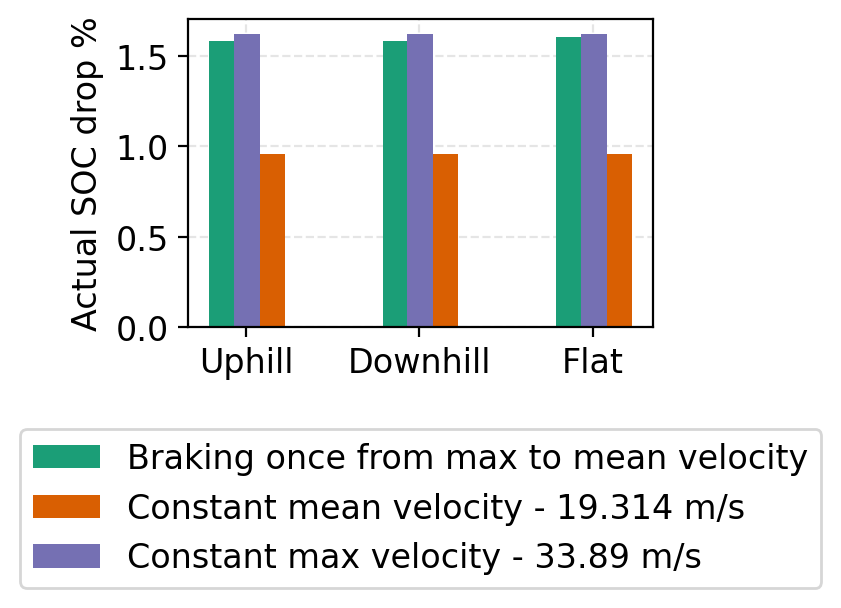

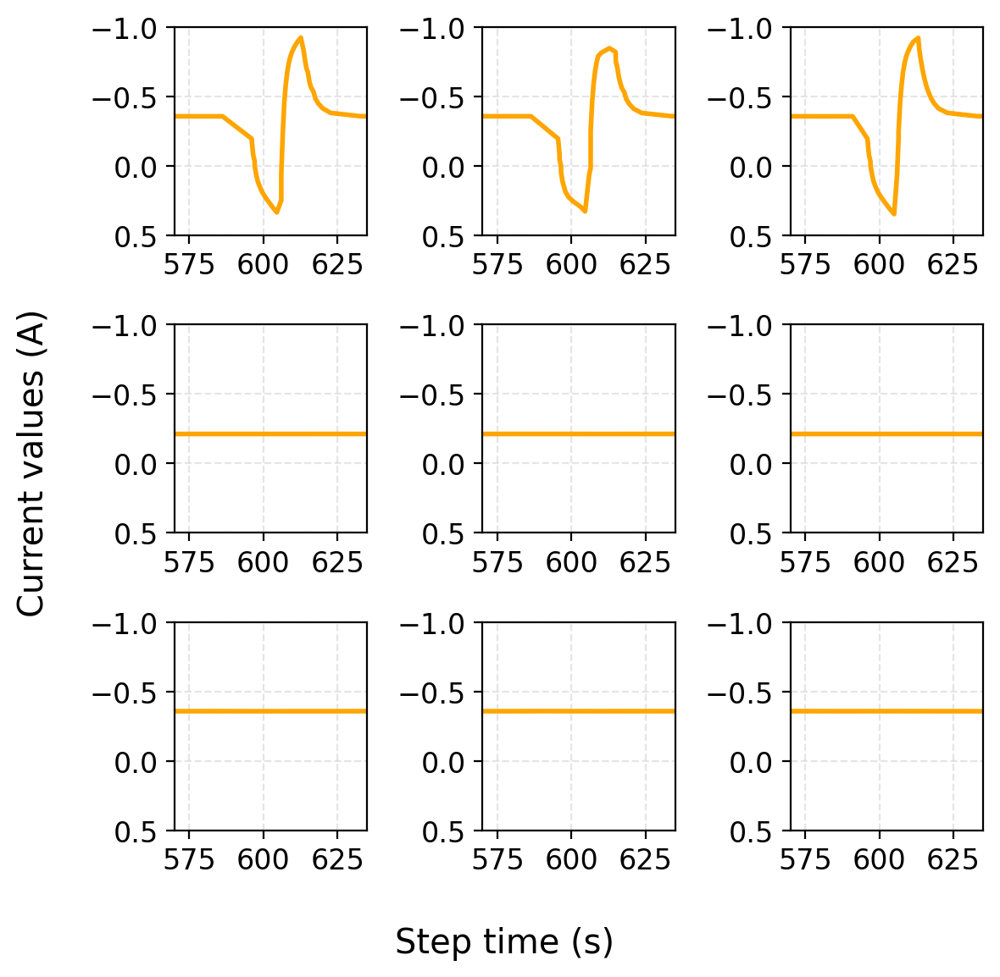

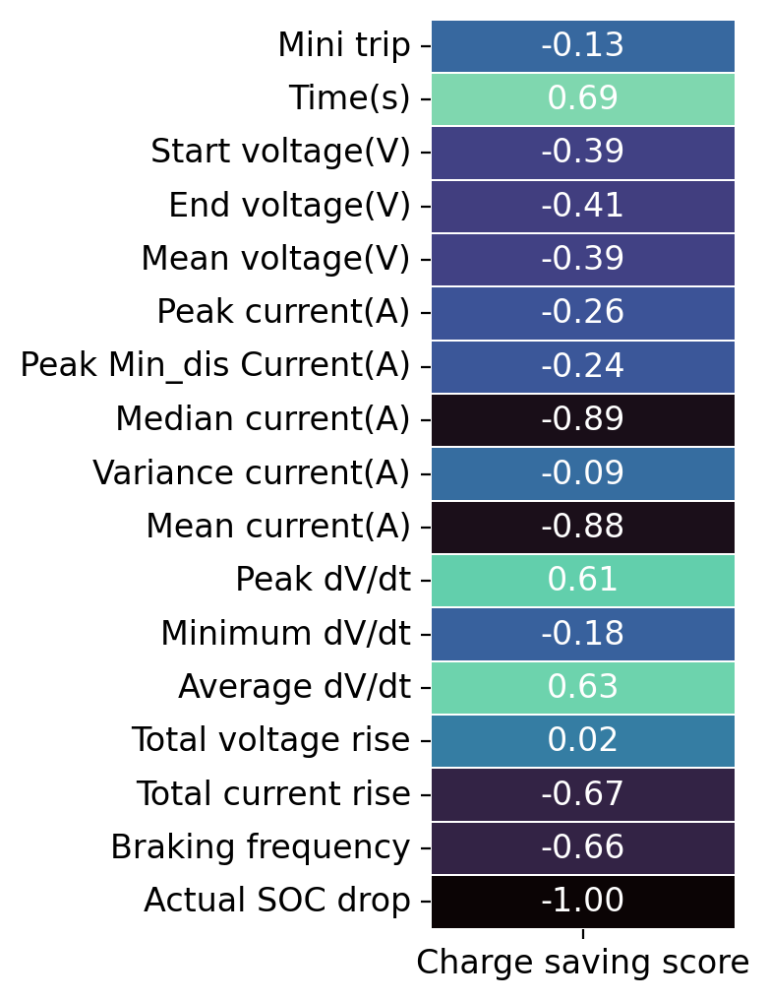

In [88]:
%run Test_data_create.ipynb

In [23]:
classification_test_path = '/Users/hemanthnr/Documents/UW/PhD/batt_pat/updated_cloned_classification/uwsunlab/Test Results/Classification_features_test.txt'
classification_test = pd.DataFrame(
    np.loadtxt(classification_test_path, delimiter=',', skiprows=1),
    columns=['Defensive driving style',
        'Assertive driving style',
        'Downhill terrain', 
        'Flat plane terrain', 
        'Uphill terrain',
        'Charge & no rest (a)',
        'No charge & no rest (b)',
        'No charge & no rest (c)',
        'No charge & no rest (d)',
        'Charge & rest (a)',
        'Charge & rest (b)',
        'Charge & rest (c)',
        'Cell ID (a)',
        'Cell ID (b)',
        'Cell ID (c)'
    ]
)

In [24]:
classification_test

,Defensive driving style,Assertive driving style,Downhill terrain,Flat plane terrain,Uphill terrain,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [23]:
cut_dict_test_300_350={}
data_list_test_300_350=[]
for key in dict_test.keys():
    datafr_350_test = cut_time(dict_test[key], 300, 350)  ##Function to select the time limit till what we want to cut down the data to
    data_list_test_300_350.append(datafr_350_test)
cut_dict_test_300_350={f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_test_300_350)}

cut_data_350_test = features_ext_test(cut_dict_test_300_350)
cut_data_350_test['Charge saving score 350'] = cut_data_350_test['SOC_drop (%)']/rel_soc_array[0]
cut_data_350_test = cut_data_350_test.drop(columns='Relative_SOC_drop', axis =1)

cut_data_350_test = pd.concat(
    [cut_data_350_test.reset_index(drop=True), classification_test.reset_index(drop=True)],
    axis=1)

cut_data_350_test

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,40.0092,3.839883,3.841950,3.842150,-0.380581,-0.423015,-0.393884,0.000280,-0.397788,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,40.0057,3.818634,3.809680,3.814415,-0.304332,-0.378248,-0.340619,0.000860,-0.340886,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,3,40.0099,3.842140,3.843057,3.842680,-0.324208,-0.396313,-0.335324,0.001003,-0.352009,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,4,40.0078,3.815004,3.808755,3.811939,-0.298760,-0.331595,-0.319680,0.000184,-0.319446,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,5,47.9190,3.657783,3.685990,3.667313,-0.342216,-0.439259,-0.387445,0.000764,-0.391859,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,6,38.0133,3.677652,3.643440,3.661131,-0.303039,-0.372706,-0.337080,0.000770,-0.337614,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,7,40.0027,3.806461,3.818501,3.813766,-0.093350,-0.252420,-0.142985,0.003801,-0.155560,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,8,40.0014,3.769205,3.766803,3.768266,-0.333085,-0.340822,-0.336564,0.000010,-0.336079,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,9,40.0029,3.844823,3.857441,3.852352,-0.101638,-0.254720,-0.154136,0.003537,-0.164706,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,10,40.0030,3.806447,3.804986,3.806025,-0.296117,-0.306126,-0.299727,0.000014,-0.300638,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [24]:
cut_dict_test_400={}
data_list_test_400=[]
for key in dict_test.keys():
    datafr_400_test = cut_time(dict_test[key], 300, 400)  ##Function to select the time limit till what we want to cut down the data to
    data_list_test_400.append(datafr_400_test)
cut_dict_test_400 ={f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_test_400)}

cut_data_400_test = features_ext_test(cut_dict_test_400)
cut_data_400_test['Charge saving score 400'] = cut_data_400_test['SOC_drop (%)']/rel_soc_array[1]
cut_data_400_test = cut_data_400_test.drop(columns= ['Relative_SOC_drop', 'Charge saving score 350'], axis =1)
cut_data_400_test = pd.concat(
    [cut_data_400_test.reset_index(drop=True), classification_test.reset_index(drop=True)],
    axis=1)

cut_data_400_test

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,96.2584,3.839883,3.841490,3.845351,-0.200052,-0.423015,-0.380581,0.004362,-0.351456,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,90.0153,3.818634,3.818428,3.814615,-0.236678,-0.378248,-0.323537,0.002058,-0.316299,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,3,98.9596,3.842140,3.840350,3.844586,-0.182106,-0.396313,-0.328787,0.003551,-0.314302,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,4,90.0148,3.815004,3.816894,3.812615,-0.228073,-0.343797,-0.307219,0.001543,-0.297694,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,5,97.4985,3.657783,3.667599,3.693211,-0.192294,-0.439259,-0.343269,0.005166,-0.328925,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,6,92.7804,3.677652,3.704055,3.667550,-0.233915,-0.391770,-0.324633,0.002169,-0.321149,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,7,87.9650,3.806461,3.796920,3.810247,-0.071189,-0.324862,-0.183861,0.007680,-0.192319,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,8,90.0043,3.769205,3.768905,3.768095,-0.300115,-0.340822,-0.333078,0.000210,-0.326442,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,9,92.2170,3.844823,3.836556,3.849807,-0.078986,-0.326652,-0.186706,0.007079,-0.191742,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,10,90.0050,3.806447,3.805844,3.805814,-0.273539,-0.306126,-0.296742,0.000131,-0.292713,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [25]:
cut_dict_test_500={}
data_list_test_500=[]
for key in dict_test.keys():
    datafr_500_test = cut_time(dict_test[key], 300, 500)  ##Function to select the time limit till what we want to cut down the data to
    data_list_test_500.append(datafr_500_test)
cut_dict_test_500 ={f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_test_500)}

cut_data_500_test = features_ext_test(cut_dict_test_500)
cut_data_500_test['Charge saving score 500'] = cut_data_500_test['SOC_drop (%)']/rel_soc_array[2]
cut_data_500_test = cut_data_500_test.drop(columns=['Relative_SOC_drop', 'Charge saving score 350',  'Charge saving score 400'], axis =1)
cut_data_500_test = pd.concat(
    [cut_data_500_test.reset_index(drop=True), classification_test.reset_index(drop=True)],
    axis=1)
cut_data_500_test

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,196.2757,3.839883,3.841633,3.843406,-0.200052,-0.423015,-0.357013,0.002383,-0.350530,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,189.4530,3.818634,3.801280,3.811349,-0.218235,-0.490156,-0.304332,0.004701,-0.318612,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,3,198.9719,3.842140,3.839731,3.842513,-0.182106,-0.396313,-0.306167,0.001977,-0.310739,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,4,192.8664,3.815004,3.804117,3.810954,-0.207504,-0.420739,-0.285790,0.002828,-0.291518,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,5,197.5124,3.657783,3.686723,3.688387,-0.192294,-0.439259,-0.343573,0.003729,-0.335485,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,6,191.1517,3.677652,3.645135,3.656578,-0.215370,-0.505642,-0.334874,0.006146,-0.342005,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,7,192.1078,3.806461,3.785449,3.797595,-0.071189,-0.521229,-0.355594,0.015362,-0.295677,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,8,195.1151,3.769205,3.765807,3.764831,-0.294194,-0.434737,-0.336830,0.001142,-0.342935,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,9,190.2029,3.844823,3.827984,3.839347,-0.078986,-0.483710,-0.326652,0.012540,-0.273482,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,10,197.9742,3.806447,3.802969,3.802177,-0.256823,-0.379907,-0.299727,0.000969,-0.306890,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [26]:
cut_dict_test_600={}
data_list_test_600=[]
for key in dict_test.keys():
    datafr_600_test = cut_time(dict_test[key], 300, 600)  ##Function to select the time limit till what we want to cut down the data to
    data_list_test_600.append(datafr_600_test)
cut_dict_test_600 ={f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_test_600)}

cut_data_600_test = features_ext_test(cut_dict_test_600)
cut_data_600_test['Charge saving score 600'] = cut_data_600_test['SOC_drop (%)']/rel_soc_array[3]
cut_data_600_test = cut_data_600_test.drop(columns=['Relative_SOC_drop', 'Charge saving score 350',  'Charge saving score 400', 'Charge saving score 500'], axis =1)
cut_data_600_test = pd.concat(
    [cut_data_600_test.reset_index(drop=True), classification_test.reset_index(drop=True)],
    axis=1)
cut_data_600_test

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,296.2875,3.839883,3.840515,3.842765,-0.200052,-0.423015,-0.332862,0.002182,-0.334653,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,289.4733,3.818634,3.802793,3.807581,-0.218235,-0.490156,-0.337440,0.003431,-0.325278,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,3,298.9897,3.842140,3.837298,3.841301,-0.182106,-0.396313,-0.293858,0.001626,-0.299168,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,4,292.8793,3.815004,3.807806,3.808744,-0.207504,-0.420739,-0.297902,0.002043,-0.293164,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,5,297.5272,3.657783,3.700524,3.689819,-0.192294,-0.439259,-0.326632,0.003068,-0.327367,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,6,295.2034,3.677652,3.691086,3.657109,-0.215370,-0.505642,-0.337642,0.004780,-0.338524,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,7,292.1119,3.806461,3.780556,3.792810,-0.071189,-0.521229,-0.356999,0.011093,-0.315480,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,8,295.1204,3.769205,3.762745,3.765299,-0.225322,-0.434737,-0.332301,0.002063,-0.320696,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,9,297.9937,3.844823,3.833319,3.833675,-0.078986,-0.483710,-0.329161,0.010027,-0.295539,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,10,297.9786,3.806447,3.796494,3.801905,-0.218674,-0.379907,-0.293611,0.001409,-0.290654,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [27]:
cut_dict_test_700={}
data_list_test_700=[]
for key in dict_test.keys():
    datafr_700_test = cut_time(dict_test[key], 300, 700)  ##Function to select the time limit till what we want to cut down the data to
    data_list_test_700.append(datafr_700_test)
cut_dict_test_700 ={f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_test_700)}

cut_data_700_test = features_ext_test(cut_dict_test_700)
cut_data_700_test['Charge saving score 700'] = cut_data_700_test['SOC_drop (%)']/rel_soc_array[4]
cut_data_700_test = cut_data_700_test.drop(columns=['Relative_SOC_drop', 'Charge saving score 350',  'Charge saving score 400', 'Charge saving score 500', 'Charge saving score 600'], axis =1)
cut_data_700_test = pd.concat(
    [cut_data_700_test.reset_index(drop=True), classification_test.reset_index(drop=True)],
    axis=1)
cut_data_700_test

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,396.3020,3.839883,3.833367,3.841794,-0.200052,-0.423015,-0.319776,0.002167,-0.323798,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,389.4931,3.818634,3.796253,3.805413,-0.218235,-0.490156,-0.298171,0.002870,-0.316989,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,3,399.0053,3.842140,3.830186,3.839758,-0.182106,-0.396313,-0.289984,0.001455,-0.292433,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,4,392.8983,3.815004,3.801585,3.807375,-0.207504,-0.420739,-0.283216,0.001704,-0.287501,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,5,389.9322,3.657783,3.678390,3.691283,-0.192294,-0.439259,-0.315975,0.002827,-0.319395,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,6,395.9699,3.677652,3.668287,3.660585,-0.215370,-0.505642,-0.319577,0.004367,-0.328174,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,7,392.1162,3.806461,3.781788,3.789627,-0.071189,-0.521229,-0.357062,0.008622,-0.320960,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,8,395.1253,3.769205,3.758938,3.764240,-0.225322,-0.434737,-0.311273,0.001596,-0.317165,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,9,392.0212,3.844823,3.823030,3.831049,-0.078986,-0.483710,-0.321415,0.007750,-0.295923,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,10,397.9853,3.806447,3.793912,3.800449,-0.218674,-0.379907,-0.284686,0.001076,-0.288427,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [28]:
cut_dict_test_800={}
data_list_test_800=[]
for key in dict_test.keys():
    datafr_800_test = cut_time(dict_test[key], 300, 800)  ##Function to select the time limit till what we want to cut down the data to
    data_list_test_800.append(datafr_800_test)
cut_dict_test_800 ={f'Minitrip{i+1}': dataf for i, dataf in enumerate(data_list_test_800)}

cut_data_800_test = features_ext_test(cut_dict_test_800)
cut_data_800_test['Charge saving score 800'] = cut_data_800_test['SOC_drop (%)']/rel_soc_array[5]
cut_data_800_test = cut_data_800_test.drop(columns=['Relative_SOC_drop', 'Charge saving score 350',  'Charge saving score 400', 'Charge saving score 500', 'Charge saving score 600', 'Charge saving score 700'], axis =1)
cut_data_800_test = pd.concat(
    [cut_data_800_test.reset_index(drop=True), classification_test.reset_index(drop=True)],
    axis=1)
cut_data_800_test

,Mini Trip,Time(s),Start Voltage(V),End Voltage(V),Mean Voltage(V),Peak Current(A),Peak Min_dis Current(A),Median Current(A),Variance Current(A),Mean Current(A),...,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1,496.3182,3.839883,3.827207,3.839476,-0.200052,-0.423015,-0.333291,0.001768,-0.326580,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2,489.5139,3.818634,3.792275,3.803153,-0.218235,-0.490156,-0.297593,0.002365,-0.312928,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,3,499.0203,3.842140,3.824928,3.837296,-0.182106,-0.396313,-0.296864,0.001177,-0.294091,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,4,492.9169,3.815004,3.798272,3.805815,-0.207504,-0.420739,-0.276024,0.001395,-0.284778,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,5,489.9454,3.657783,3.668404,3.688104,-0.192294,-0.439259,-0.327447,0.002411,-0.322343,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,6,495.9903,3.677652,3.666859,3.661507,-0.215370,-0.505642,-0.297886,0.003869,-0.323654,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,7,490.3326,3.806461,3.776230,3.786902,-0.071189,-0.521229,-0.357062,0.007316,-0.324077,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,8,495.1343,3.769205,3.754430,3.762642,-0.225322,-0.434737,-0.318058,0.001305,-0.319327,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,9,490.9904,3.844823,3.816317,3.828192,-0.078986,-0.483710,-0.319165,0.006916,-0.297216,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,10,497.9896,3.806447,3.789376,3.798655,-0.218674,-0.379907,-0.288652,0.000871,-0.289711,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### combined testing data (features)

In [29]:
X_test = cut_data_350_test.drop("Charge saving score 350", axis=1)
X_test = X_test[['End Voltage(V)', 'Median Current(A)', 'Min dV/dt', 'Total Current Rise', 'Assertive driving style',
        'Defensive driving style',
        'Downhill terrain', 
        'Flat plane terrain', 
        'Uphill terrain',
        'Charge & no rest (a)',
        'No charge & no rest (b)',
        'No charge & no rest (c)',
        'No charge & no rest (d)',
        'Charge & rest (a)',
        'Charge & rest (b)',
        'Charge & rest (c)',
        'Cell ID (a)',
        'Cell ID (b)',
        'Cell ID (c)']]

### combined testing data (target)

In [30]:
y_test_350 = cut_data_350_test["Charge saving score 350"]
y_test_400 = cut_data_400_test["Charge saving score 400"]
y_test_500 = cut_data_500_test["Charge saving score 500"]
y_test_600 = cut_data_600_test["Charge saving score 600"]
y_test_700 = cut_data_700_test["Charge saving score 700"]
y_test_800 = cut_data_800_test["Charge saving score 800"]

Y_test = 100 * pd.DataFrame({
    "Charge saving score 350": y_test_350,
    "Charge saving score 400": y_test_400,
    "Charge saving score 500": y_test_500,
    "Charge saving score 600": y_test_600,
    "Charge saving score 700": y_test_700,
    "Charge saving score 800": y_test_800,
})

In [ ]:
Y_test

In [85]:
rel_soc_array

[-0.13229649408555544,
 -0.2976534474760185,
 -0.6283966251697222,
 -0.9591572357125927,
 -1.28986870146,
 -1.6206225461921293]

In [88]:
df = Y_test['Charge saving score 350']/rel_soc_array[0]
df = Y_test['Charge saving score 400']/ rel_soc_array[1]
df = Y_test['Charge saving score 500']/ rel_soc_array[2]
df = Y_test['Charge saving score 600']/ rel_soc_array[3]
df = Y_test['Charge saving score 700']/ rel_soc_array[4]
df = Y_test['Charge saving score 800']*rel_soc_array[5]

In [89]:
df

0    -149.316730
1    -141.271572
2    -135.146893
3    -129.202942
4    -147.673303
5    -142.718516
6    -147.064791
7    -145.874284
8    -134.264843
9    -133.360795
10   -148.088641
11   -144.952126
Name: Charge saving score 800, dtype: float64

## Random Forest regression model

In [31]:
def rf_trainer(X, Y, X_test, Y_test, iterations=10):
    y_pred_train_list = []
    y_true_train_list = []
    mae_train_list = []
    mape_train_list = []
    y_pred_val_list = [] 
    y_true_val_list = []
    mae_val_list = []
    mape_val_list = []
    mae_test_list = []
    mape_test_list = []
    y_pred_test_list = [] 
    y_true_test_list = []
    
    skf = KFold(n_splits=5, random_state=42, shuffle=True)
    for i in range(iterations):
        print(f"--- Iteration {i+1}/{iterations} ---")

        x_train, x_val, y_train, y_val = train_test_split(X, Y, test_size=0.2, random_state=42)
        model = RandomForestRegressor()
        param_grid = {'criterion': ['squared_error', 'friedman_mse', 'absolute_error'], 'max_depth': np.arange(2, 10)}
        model_search = GridSearchCV(estimator=model,
                                    param_grid=param_grid,
                                    scoring=['neg_mean_squared_error', 'neg_mean_absolute_error', 'r2'],
                                    cv=skf,
                                    refit='neg_mean_absolute_error',
                                    verbose=3,
                                    return_train_score=True)
        
        model_search.fit(x_train, y_train)
        best_model = model_search.best_estimator_
        
        # Training set predictions and metrics
        y_pred_train = best_model.predict(x_train)
        y_true_train_list.append(y_train)
        y_pred_train_list.append(y_pred_train)
        mae_train = mean_absolute_error(y_train, y_pred_train)
        mape_train = mean_absolute_percentage_error(y_train, y_pred_train)
        mae_train_list.append(mae_train)
        mape_train_list.append(mape_train)
        
        # Validation set predictions and metrics
        y_pred_val = best_model.predict(x_val)
        y_true_val_list.append(y_val)
        y_pred_val_list.append(y_pred_val)
        mae_val = mean_absolute_error(y_val, y_pred_val)
        mape_val = mean_absolute_percentage_error(y_val, y_pred_val)
        mae_val_list.append(mae_val)
        mape_val_list.append(mape_val)
        
        # Test set predictions and metrics
        y_pred_test = best_model.predict(X_test)
        y_true_test_list.append(Y_test)
        y_pred_test_list.append(y_pred_test)
        mae_test = mean_absolute_error(Y_test, y_pred_test)
        mape_test = mean_absolute_percentage_error(Y_test, y_pred_test)
        mae_test_list.append(mae_test)
        mape_test_list.append(mape_test)
        
        print(f"Iteration {i+1} Results:")
        print(f"Validation MAE: {mae_val}, MAPE: {mape_val}")
        print(f"Test MAE: {mae_test}, MAPE: {mape_test}")
    
    # Calculate averages
    mae_train_avg = np.mean(mae_train_list)
    mape_train_avg = np.mean(mape_train_list)
    mae_val_avg = np.mean(mae_val_list)
    mape_val_avg = np.mean(mape_val_list)
    mae_test_avg = np.mean(mae_test_list)
    mape_test_avg = np.mean(mape_test_list)
    
    print("\n--- Final Results Across All Iterations ---")
    print(f"Average Train MAE: {mae_train_avg}")
    print(f"Average Train MAPE: {mape_train_avg}")
    print(f"Average Validation MAE: {mae_val_avg}")
    print(f"Average Validation MAPE: {mape_val_avg}")
    print(f"Average Test MAE: {mae_test_avg}")
    print(f"Average Test MAPE: {mape_test_avg}")
    
    return (y_pred_train_list, y_true_train_list, mae_train_list, mape_train_list, 
            y_pred_val_list, y_true_val_list, mae_val_list, mape_val_list,  
            y_pred_test_list, y_true_test_list, mae_test_list, mape_test_list, mae_train_avg, 
            mape_train_avg,mae_val_avg, mape_val_avg, mae_test_avg, mape_test_avg)

#### Results for 350 seconds

In [32]:
y_pred_train_list_350, y_true_train_list_350, mae_train_list_350, mape_train_list_350, y_pred_val_list_350, y_true_val_list_350, mae_val_list_350, mape_val_list_350, y_pred_test_list_350, y_true_test_list_350, mae_test_list_350, mape_test_list_350, mae_train_avg_350, mape_train_avg_350, mae_val_avg_350, mape_val_avg_350, mae_test_avg_350, mape_test_avg_350 = rf_trainer(X_train, Y_train["Charge saving score 350"], X_test, Y_test["Charge saving score 350"])

--- Iteration 1/10 ---
Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.632, test=-5.311) neg_mean_squared_error: (train=-36.150, test=-53.861) r2: (train=0.848, test=0.677) total time=   0.2s
[CV 2/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.564, test=-7.436) neg_mean_squared_error: (train=-40.689, test=-77.829) r2: (train=0.813, test=0.642) total time=   0.1s
[CV 3/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.686, test=-6.725) neg_mean_squared_error: (train=-36.082, test=-92.715) r2: (train=0.829, test=0.659) total time=   0.1s
[CV 4/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-5.024, test=-5.304) neg_mean_squared_error: (train=-43.397, test=-47.300) r2: (train=0.796, test=0.822) total time=   0.1s
[CV 5/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.9

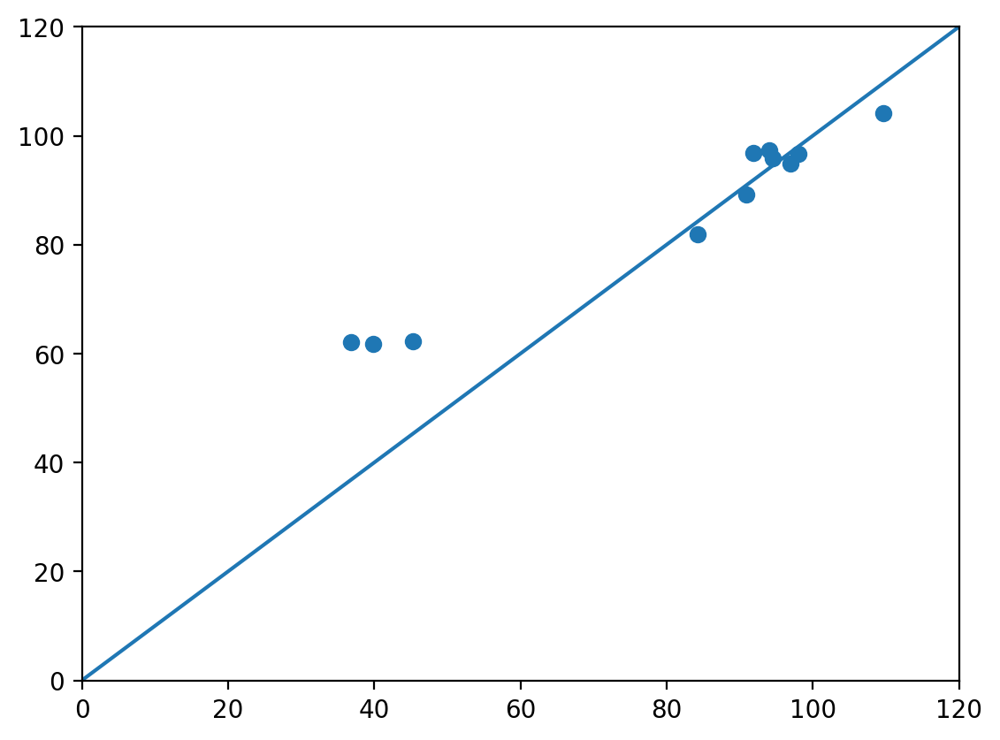

In [33]:
plt.scatter(np.mean(y_true_test_list_350, axis=0), np.mean(y_pred_test_list_350, axis=0))
plt.plot([0, 120], [0, 120])
plt.xlim(0, 120)
plt.ylim(0, 120)
plt.show()

In [34]:
y_pred_train_list_400, y_true_train_list_400, mae_train_list_400, mape_train_list_400, y_pred_val_list_400, y_true_val_list_400, mae_val_list_400, mape_val_list_400, y_pred_test_list_400, y_true_test_list_400, mae_test_list_400, mape_test_list_400, mae_train_avg_400, mape_train_avg_400, mae_val_avg_400, mape_val_avg_400, mae_test_avg_400, mape_test_avg_400 =  rf_trainer(X_train, Y_train["Charge saving score 400"], X_test, Y_test["Charge saving score 400"])

--- Iteration 1/10 ---
Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-5.748, test=-4.447) neg_mean_squared_error: (train=-45.066, test=-25.295) r2: (train=0.669, test=0.764) total time=   0.1s
[CV 2/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.912, test=-7.412) neg_mean_squared_error: (train=-33.631, test=-81.916) r2: (train=0.735, test=0.118) total time=   0.0s
[CV 3/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-5.200, test=-7.285) neg_mean_squared_error: (train=-37.014, test=-68.113) r2: (train=0.714, test=0.486) total time=   0.0s
[CV 4/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-5.339, test=-7.001) neg_mean_squared_error: (train=-37.836, test=-71.694) r2: (train=0.678, test=0.585) total time=   0.0s
[CV 5/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-5.0

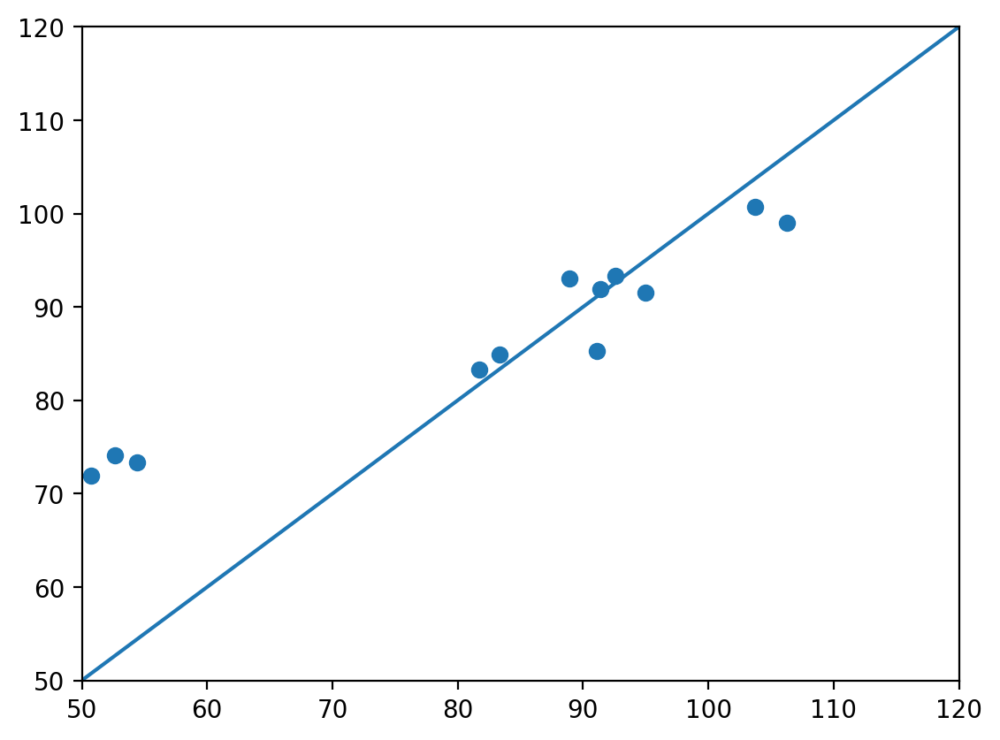

In [35]:
plt.scatter(np.mean(y_true_test_list_400, axis=0), np.mean(y_pred_test_list_400, axis=0))
plt.plot([50, 120], [50, 120])
plt.xlim(50, 120)
plt.ylim(50, 120)
plt.show()

In [36]:
y_pred_train_list_500, y_true_train_list_500, mae_train_list_500, mape_train_list_500, y_pred_val_list_500, y_true_val_list_500, mae_val_list_500, mape_val_list_500, y_pred_test_list_500, y_true_test_list_500, mae_test_list_500, mape_test_list_500, mae_train_avg_500, mape_train_avg_500, mae_val_avg_500, mape_val_avg_500, mae_test_avg_500, mape_test_avg_500 =  rf_trainer(X_train, Y_train["Charge saving score 500"], X_test, Y_test["Charge saving score 500"])

--- Iteration 1/10 ---
Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.547, test=-4.617) neg_mean_squared_error: (train=-32.571, test=-30.355) r2: (train=0.631, test=0.629) total time=   0.1s
[CV 2/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.274, test=-8.030) neg_mean_squared_error: (train=-29.125, test=-94.703) r2: (train=0.614, test=0.113) total time=   0.0s
[CV 3/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.908, test=-5.914) neg_mean_squared_error: (train=-28.098, test=-54.963) r2: (train=0.675, test=0.380) total time=   0.0s
[CV 4/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.040, test=-5.123) neg_mean_squared_error: (train=-28.489, test=-54.131) r2: (train=0.683, test=0.220) total time=   0.0s
[CV 5/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.4

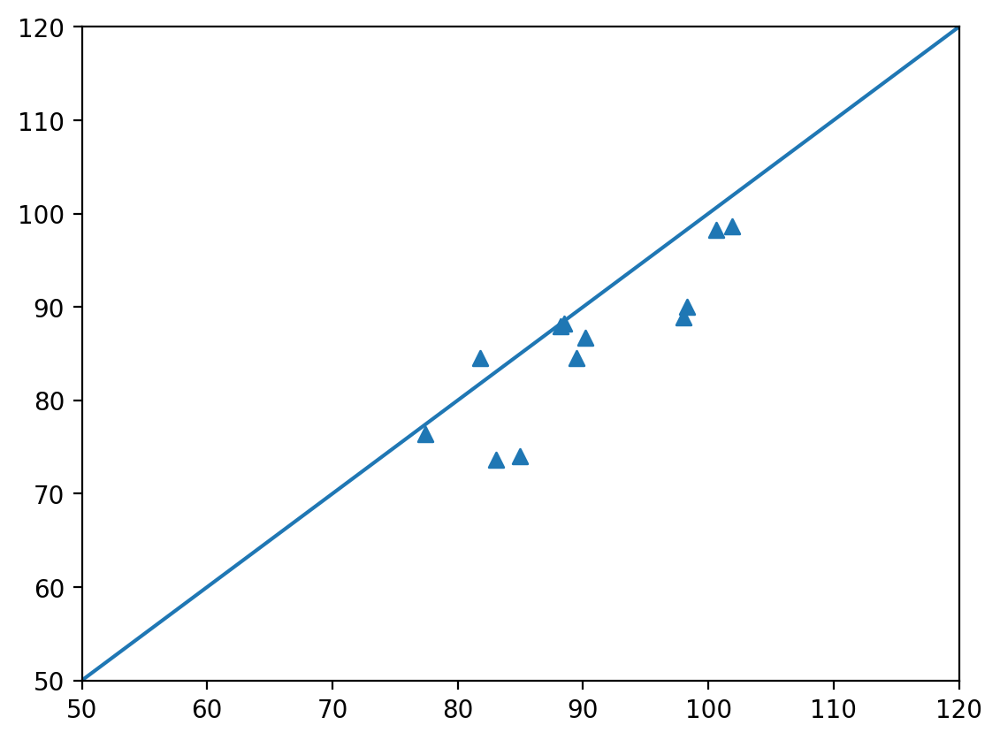

In [37]:
plt.scatter(np.mean(y_true_test_list_500, axis=0), np.mean(y_pred_test_list_500, axis=0), marker = '^', alpha=1, zorder =4)
# plt.scatter(np.mean(y_true_val_list_500, axis=0), np.mean(y_pred_val_list_500, axis=0), marker='o', alpha=0.5)
# plt.scatter(np.mean(y_true_train_list_500, axis=0), np.mean(y_pred_train_list_500, axis=0), marker= 's', alpha=0.5)
plt.plot([50, 120], [50, 120])
plt.xlim(50, 120)
plt.ylim(50, 120)
plt.show()

In [38]:
y_pred_train_list_600, y_true_train_list_600, mae_train_list_600, mape_train_list_600, y_pred_val_list_600, y_true_val_list_600, mae_val_list_600, mape_val_list_600, y_pred_test_list_600, y_true_test_list_600, mae_test_list_600, mape_test_list_600, mae_train_avg_600, mape_train_avg_600, mae_val_avg_600, mape_val_avg_600, mae_test_avg_600, mape_test_avg_600 =  rf_trainer(X_train, Y_train["Charge saving score 600"], X_test, Y_test["Charge saving score 600"])

--- Iteration 1/10 ---
Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.451, test=-3.199) neg_mean_squared_error: (train=-31.302, test=-17.530) r2: (train=0.462, test=0.556) total time=   0.0s
[CV 2/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.962, test=-6.003) neg_mean_squared_error: (train=-24.385, test=-60.211) r2: (train=0.486, test=0.113) total time=   0.0s
[CV 3/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.745, test=-6.127) neg_mean_squared_error: (train=-24.030, test=-52.702) r2: (train=0.541, test=0.144) total time=   0.0s
[CV 4/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.038, test=-5.149) neg_mean_squared_error: (train=-26.461, test=-40.439) r2: (train=0.528, test=0.050) total time=   0.0s
[CV 5/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.1

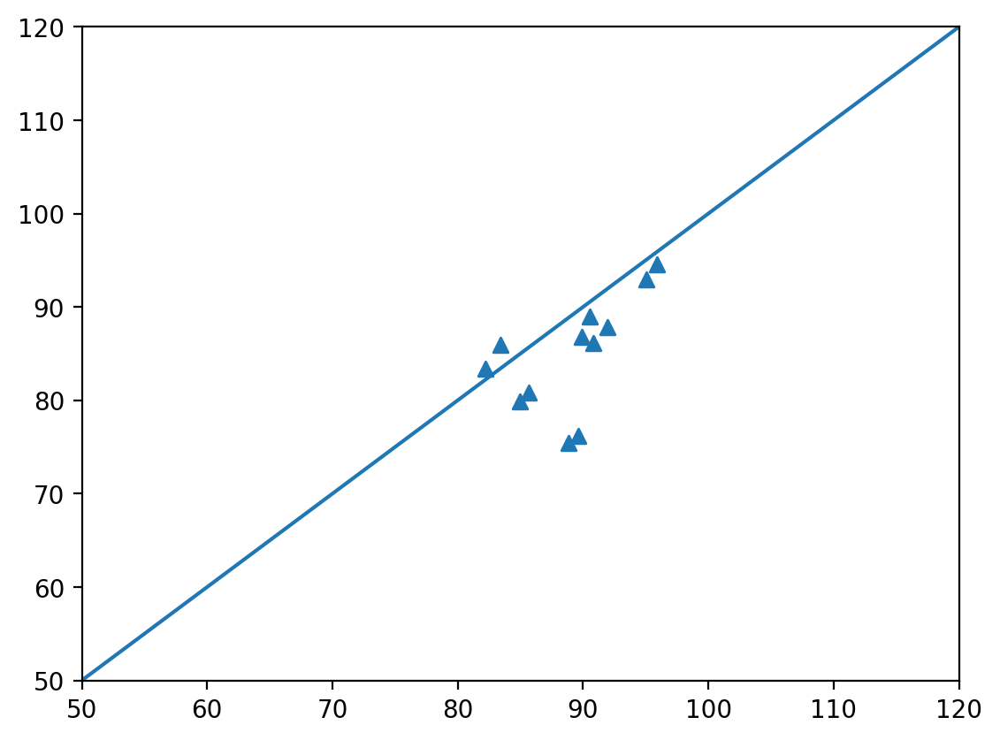

In [39]:
plt.scatter(np.mean(y_true_test_list_600, axis=0), np.mean(y_pred_test_list_600, axis=0), marker = '^', alpha=1)
# plt.scatter(np.mean(y_true_val_list_600, axis=0), np.mean(y_pred_val_list_600, axis=0), marker='o', alpha=0.5)
# plt.scatter(np.mean(y_true_train_list_600, axis=0), np.mean(y_pred_train_list_600, axis=0), marker= 's', alpha=0.5)
plt.plot([50, 120], [50, 120])
plt.xlim(50, 120)
plt.ylim(50, 120)
plt.show()

In [40]:
y_pred_train_list_700, y_true_train_list_700, mae_train_list_700, mape_train_list_700, y_pred_val_list_700, y_true_val_list_700, mae_val_list_700, mape_val_list_700, y_pred_test_list_700, y_true_test_list_700, mae_test_list_700, mape_test_list_700, mae_train_avg_700, mape_train_avg_700, mae_val_avg_700, mape_val_avg_700, mae_test_avg_700, mape_test_avg_700 =  rf_trainer(X_train, Y_train["Charge saving score 700"], X_test, Y_test["Charge saving score 700"])

--- Iteration 1/10 ---
Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.251, test=-3.904) neg_mean_squared_error: (train=-31.068, test=-21.603) r2: (train=0.473, test=0.282) total time=   0.1s
[CV 2/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.858, test=-5.710) neg_mean_squared_error: (train=-26.457, test=-56.927) r2: (train=0.442, test=0.176) total time=   0.0s
[CV 3/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.913, test=-6.259) neg_mean_squared_error: (train=-27.563, test=-63.195) r2: (train=0.465, test=-0.075) total time=   0.0s
[CV 4/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.139, test=-4.686) neg_mean_squared_error: (train=-30.465, test=-41.003) r2: (train=0.434, test=0.154) total time=   0.0s
[CV 5/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-4.

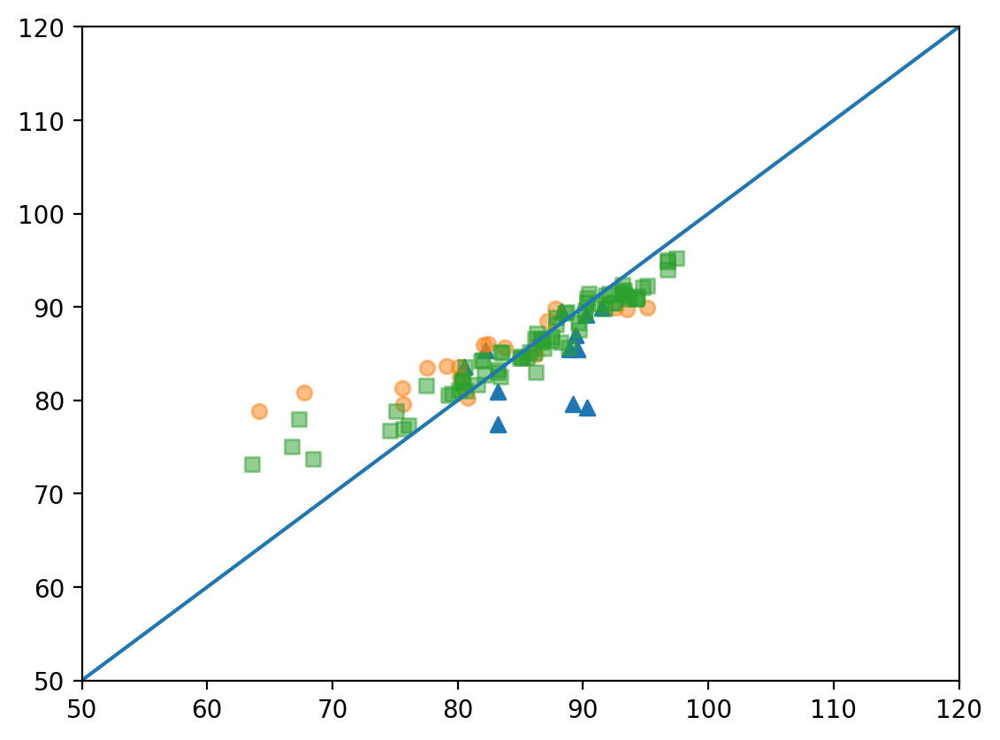

In [41]:
plt.scatter(np.mean(y_true_test_list_700, axis=0), np.mean(y_pred_test_list_700, axis=0), marker = '^', alpha=1)
plt.scatter(np.mean(y_true_val_list_700, axis=0), np.mean(y_pred_val_list_700, axis=0), marker='o', alpha=0.5)
plt.scatter(np.mean(y_true_train_list_700, axis=0), np.mean(y_pred_train_list_700, axis=0), marker= 's', alpha=0.5)
plt.plot([50, 120], [50, 120])
plt.xlim(50, 120)
plt.ylim(50, 120)
plt.show()

In [42]:
y_pred_train_list_800, y_true_train_list_800, mae_train_list_800, mape_train_list_800, y_pred_val_list_800, y_true_val_list_800, mae_val_list_800, mape_val_list_800, y_pred_test_list_800, y_true_test_list_800, mae_test_list_800, mape_test_list_800, mae_train_avg_800, mape_train_avg_800, mae_val_avg_800, mape_val_avg_800, mae_test_avg_800, mape_test_avg_800 =  rf_trainer(X_train, Y_train["Charge saving score 800"], X_test, Y_test["Charge saving score 800"])

--- Iteration 1/10 ---
Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.326, test=-3.470) neg_mean_squared_error: (train=-20.857, test=-18.909) r2: (train=0.486, test=0.449) total time=   0.0s
[CV 2/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.260, test=-3.802) neg_mean_squared_error: (train=-19.205, test=-32.081) r2: (train=0.453, test=0.405) total time=   0.0s
[CV 3/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.081, test=-4.505) neg_mean_squared_error: (train=-17.945, test=-39.668) r2: (train=0.557, test=-0.165) total time=   0.0s
[CV 4/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.329, test=-3.771) neg_mean_squared_error: (train=-20.483, test=-27.037) r2: (train=0.482, test=0.274) total time=   0.0s
[CV 5/5] END criterion=squared_error, max_depth=2; neg_mean_absolute_error: (train=-3.

In [43]:
y_true_test_list_800

[0     92.135415
 1     87.171175
 2     83.391961
 3     79.724266
 4     91.121343
 5     88.064008
 6     90.745863
 7     90.011264
 8     82.847695
 9     82.289856
 10    91.377626
 11    89.442250
 Name: Charge saving score 800, dtype: float64,
 0     92.135415
 1     87.171175
 2     83.391961
 3     79.724266
 4     91.121343
 5     88.064008
 6     90.745863
 7     90.011264
 8     82.847695
 9     82.289856
 10    91.377626
 11    89.442250
 Name: Charge saving score 800, dtype: float64,
 0     92.135415
 1     87.171175
 2     83.391961
 3     79.724266
 4     91.121343
 5     88.064008
 6     90.745863
 7     90.011264
 8     82.847695
 9     82.289856
 10    91.377626
 11    89.442250
 Name: Charge saving score 800, dtype: float64,
 0     92.135415
 1     87.171175
 2     83.391961
 3     79.724266
 4     91.121343
 5     88.064008
 6     90.745863
 7     90.011264
 8     82.847695
 9     82.289856
 10    91.377626
 11    89.442250
 Name: Charge saving score 800, dtype: f

In [44]:
np.mean(y_pred_test_list_800, axis=0).shape

(12,)

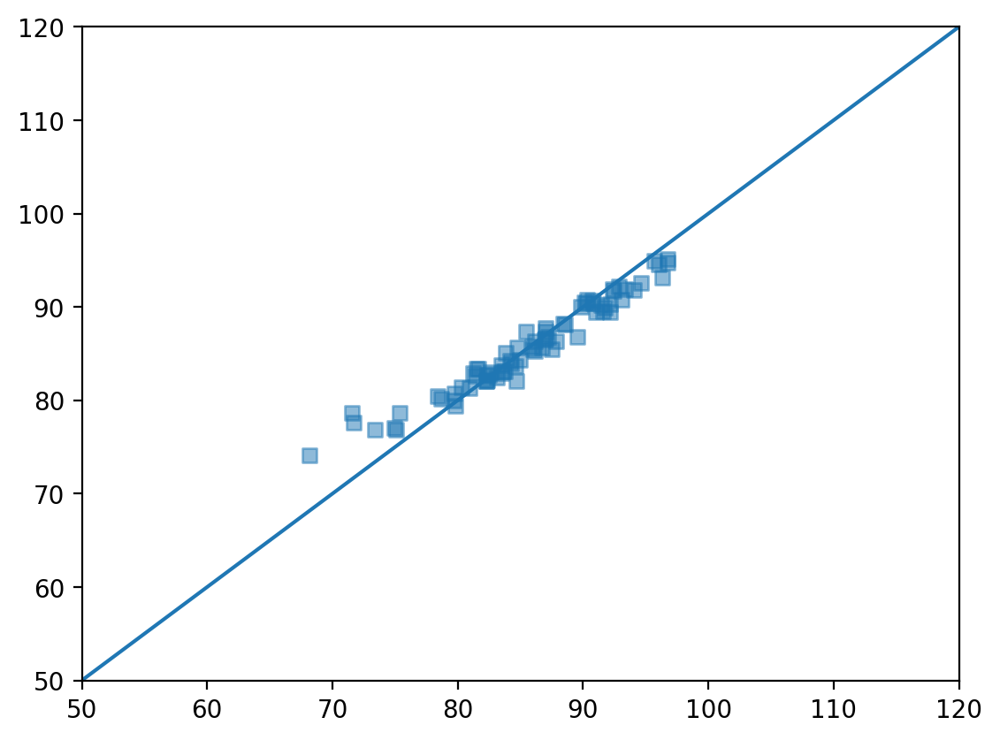

In [45]:
# plt.scatter(np.mean(y_true_test_list_800, axis=0), np.mean(y_pred_test_list_800, axis=0), marker = '^', alpha=1)
# plt.scatter(np.mean(y_true_val_list_800, axis=0), np.mean(y_pred_val_list_800, axis=0), marker='o', alpha=0.5)
plt.scatter(np.mean(y_true_train_list_800, axis=0), np.mean(y_pred_train_list_800, axis=0), marker= 's', alpha=0.5)
plt.plot([50, 120], [50, 120])
plt.xlim(50, 120)
plt.ylim(50, 120)
plt.show()

#### save results

In [46]:
y_train_actual_dict = {
    '350': pd.DataFrame(y_true_train_list_350).iloc[:1],
    '400': pd.DataFrame(y_true_train_list_400).iloc[:1],
    '500': pd.DataFrame(y_true_train_list_500).iloc[:1],
    '600': pd.DataFrame(y_true_train_list_600).iloc[:1],
    '700': pd.DataFrame(y_true_train_list_700).iloc[:1],
    '800': pd.DataFrame(y_true_train_list_800).iloc[:1]
}

y_val_actual_dict = {
    '350': pd.DataFrame(y_true_val_list_350).iloc[:1],
    '400': pd.DataFrame(y_true_val_list_400).iloc[:1],
    '500': pd.DataFrame(y_true_val_list_500).iloc[:1],
    '600': pd.DataFrame(y_true_val_list_600).iloc[:1],
    '700': pd.DataFrame(y_true_val_list_700).iloc[:1],
    '800': pd.DataFrame(y_true_val_list_800).iloc[:1]
}

y_test_actual_dict = {
    '350': pd.DataFrame(y_true_test_list_350).iloc[:1],
    '400': pd.DataFrame(y_true_test_list_400).iloc[:1],
    '500': pd.DataFrame(y_true_test_list_500).iloc[:1],
    '600': pd.DataFrame(y_true_test_list_600).iloc[:1],
    '700': pd.DataFrame(y_true_test_list_700).iloc[:1],
    '800': pd.DataFrame(y_true_test_list_800).iloc[:1]
}

# Save training data to HDF5
train_hdf5_file_path = "forecast_results/rf_model/y_train_actual.h5"
with pd.HDFStore(train_hdf5_file_path, mode='w') as hdf:
    for key, df in y_train_actual_dict.items():
        hdf.put(f"key_{key}", df)
print(f"Training data saved to {train_hdf5_file_path}")

# Save validation data to HDF5
val_hdf5_file_path = "forecast_results/rf_model/y_val_actual.h5"
with pd.HDFStore(val_hdf5_file_path, mode='w') as hdf:
    for key, df in y_val_actual_dict.items():
        hdf.put(f"key_{key}", df)
print(f"Validation data saved to {val_hdf5_file_path}")

# Save test data to HDF5
test_hdf5_file_path = "forecast_results/rf_model/y_test_actual.h5"
with pd.HDFStore(test_hdf5_file_path, mode='w') as hdf:
    for key, df in y_test_actual_dict.items():
        hdf.put(f"key_{key}", df)
print(f"Test data saved to {test_hdf5_file_path}")

Training data saved to forecast_results/rf_model/y_train_actual.h5
Validation data saved to forecast_results/rf_model/y_val_actual.h5
Test data saved to forecast_results/rf_model/y_test_actual.h5


In [ ]:
# Y-pred (training data)
y_train_prediction_dict = {
    '350': pd.DataFrame(y_pred_train_list_350),
    '400': pd.DataFrame(y_pred_train_list_400),
    '500': pd.DataFrame(y_pred_train_list_500),
    '600': pd.DataFrame(y_pred_train_list_600),
    '700': pd.DataFrame(y_pred_train_list_700),
    '800': pd.DataFrame(y_pred_train_list_800)
}

# Y-pred (validation data)
y_val_prediction_dict = {
    '350': pd.DataFrame(y_pred_val_list_350),
    '400': pd.DataFrame(y_pred_val_list_400),
    '500': pd.DataFrame(y_pred_val_list_500),
    '600': pd.DataFrame(y_pred_val_list_600),
    '700': pd.DataFrame(y_pred_val_list_700),
    '800': pd.DataFrame(y_pred_val_list_800)
}

# Y-pred (test data)
y_test_prediction_dict = {
    '350': pd.DataFrame(y_pred_test_list_350),
    '400': pd.DataFrame(y_pred_test_list_400),
    '500': pd.DataFrame(y_pred_test_list_500),
    '600': pd.DataFrame(y_pred_test_list_600),
    '700': pd.DataFrame(y_pred_test_list_700),
    '800': pd.DataFrame(y_pred_test_list_800)
}

# Save training prediction data to HDF5
train_prediction_hdf5_file_path = "forecast_results/rf_model/y_train_prediction.h5"
with pd.HDFStore(train_prediction_hdf5_file_path, mode='w') as hdf:
    for key, df in y_train_prediction_dict.items():
        hdf.put(f"key_{key}", df)
print(f"Training prediction data saved to {train_prediction_hdf5_file_path}")

# Save validation prediction data to HDF5
val_prediction_hdf5_file_path = "forecast_results/rf_model/y_val_prediction.h5"
with pd.HDFStore(val_prediction_hdf5_file_path, mode='w') as hdf:
    for key, df in y_val_prediction_dict.items():
        hdf.put(f"key_{key}", df)
print(f"Validation prediction data saved to {val_prediction_hdf5_file_path}")

# Save test prediction data to HDF5
test_prediction_hdf5_file_path = "forecast_results/rf_model/y_test_prediction.h5"
with pd.HDFStore(test_prediction_hdf5_file_path, mode='w') as hdf:
    for key, df in y_test_prediction_dict.items():
        hdf.put(f"key_{key}", df)
print(f"Test prediction data saved to {test_prediction_hdf5_file_path}")

In [48]:
##Average MAE scores
avg_mae_results = pd.DataFrame({
    '350': [mae_train_avg_350, mae_val_avg_350, mae_test_avg_350],
    '400': [mae_train_avg_400, mae_val_avg_400, mae_test_avg_400],
    '500': [mae_train_avg_500, mae_val_avg_500, mae_test_avg_500],
    '600': [mae_train_avg_600, mae_val_avg_600, mae_test_avg_600],
    '700': [mae_train_avg_700, mae_val_avg_700, mae_test_avg_700],
    '800': [mae_train_avg_800, mae_val_avg_800, mae_test_avg_800]
}, index=['train', 'validation', 'test'])

##Average MAPE scores
avg_mape_results = pd.DataFrame({
    '350': [mape_train_avg_350, mape_val_avg_350, mape_test_avg_350],
    '400': [mape_train_avg_400, mape_val_avg_400, mape_test_avg_400],
    '500': [mape_train_avg_500, mape_val_avg_500, mape_test_avg_500],
    '600': [mape_train_avg_600, mape_val_avg_600, mape_test_avg_600],
    '700': [mape_train_avg_700, mape_val_avg_700, mape_test_avg_700],
    '800': [mape_train_avg_800, mape_val_avg_800, mape_test_avg_800]
}, index=['train', 'val', 'test'])

avg_mae_results.to_hdf("forecast_results/rf_model/avg_mae_results.h5", key='avg_mae', mode='w')
avg_mape_results.to_hdf("forecast_results/rf_model/avg_mape_results.h5", key='avg_mape', mode='w')


## Plotting

#### parity plots

In [5]:
actual_train =pd.HDFStore('forecast_results/rf_model/y_train_actual.h5', mode='r')
actual_val =pd.HDFStore('forecast_results/rf_model/y_val_actual.h5', mode='r')
actual_test =pd.HDFStore('forecast_results/rf_model/y_test_actual.h5', mode='r')  

In [6]:
predicted_train = pd.HDFStore('forecast_results/rf_model/y_train_prediction.h5', mode='r')
predicted_val = pd.HDFStore('forecast_results/rf_model/y_val_prediction.h5', mode='r')
predicted_test = pd.HDFStore('forecast_results/rf_model/y_test_prediction.h5', mode='r')

In [7]:
predicted_test['key_350']
predicted_test['key_400']
predicted_test['key_500']
predicted_test['key_600']
predicted_test['key_700']
predicted_test['key_800']

,0,1,2,3,4,5,6,7,8,9,10,11
0,89.366903,90.077342,83.304935,81.781910,88.726426,89.530774,81.635273,86.134425,77.258791,83.644809,82.566405,87.570536
1,89.638493,90.639373,83.413003,82.990982,88.939317,90.117596,81.435549,86.602642,75.184335,84.036958,82.417367,88.453283
2,88.651450,88.644223,83.933004,82.564668,87.129212,89.304102,80.562338,85.771830,77.840661,83.992053,80.733792,88.025368
3,88.987731,88.337371,82.871236,81.564060,87.250357,89.019229,80.519302,85.847635,77.966127,84.069307,81.530230,86.597245
4,89.259150,89.818066,81.939072,82.314580,88.578140,88.719265,81.747069,84.742911,75.557703,83.512712,82.929446,87.103019
5,88.926241,87.941744,84.124338,81.128999,88.425840,88.582797,81.433627,84.870727,78.357409,82.978013,81.861663,86.745648
6,88.788513,88.433010,83.366030,82.113393,86.616327,89.528976,80.438346,85.731119,76.857592,85.091627,81.503392,87.241238
7,88.832164,89.277229,84.608617,81.842002,87.429798,89.404752,80.446851,86.144207,78.447585,84.121038,81.184520,88.433758
8,88.793682,87.307942,83.181727,82.150365,88.334751,87.384228,81.230288,84.624513,79.230424,83.795874,82.027260,85.825923
9,89.800429,89.860036,82.866227,82.073362,89.452881,87.725385,81.823921,85.635630,77.327013,83.861967,82.355022,86.189142


In [8]:
y_train_prediction_avg_350 = np.mean(predicted_train['key_350'], axis=0)
y_train_prediction_avg_400 = np.mean(predicted_train['key_400'], axis=0)
y_train_prediction_avg_500 = np.mean(predicted_train['key_500'], axis=0)
y_train_prediction_avg_600 = np.mean(predicted_train['key_600'], axis=0)
y_train_prediction_avg_700 = np.mean(predicted_train['key_700'], axis=0)
y_train_prediction_avg_800 = np.mean(predicted_train['key_800'], axis=0)

In [9]:
y_val_prediction_avg_350 = np.mean(predicted_val['key_350'], axis=0)
y_val_prediction_avg_400 = np.mean(predicted_val['key_400'], axis=0)
y_val_prediction_avg_500 = np.mean(predicted_val['key_500'], axis=0)
y_val_prediction_avg_600 = np.mean(predicted_val['key_600'], axis=0)
y_val_prediction_avg_700 = np.mean(predicted_val['key_700'], axis=0)
y_val_prediction_avg_800 = np.mean(predicted_val['key_800'], axis=0)

In [10]:
y_test_prediction_avg_350 = np.mean(predicted_test['key_350'], axis=0)
y_test_prediction_avg_400 = np.mean(predicted_test['key_400'], axis=0)
y_test_prediction_avg_500 = np.mean(predicted_test['key_500'], axis=0)
y_test_prediction_avg_600 = np.mean(predicted_test['key_600'], axis=0)
y_test_prediction_avg_700 = np.mean(predicted_test['key_700'], axis=0)
y_test_prediction_avg_800 = np.mean(predicted_test['key_800'], axis=0)

In [12]:
keys = [350, 400, 500, 600, 700, 800]

true_train = {
    350: np.array(actual_train['key_350']).flatten(),
    400: np.array(actual_train['key_400']).flatten(),
    500: np.array(actual_train['key_500']).flatten(),
    600: np.array(actual_train['key_600']).flatten(),
    700: np.array(actual_train['key_700']).flatten(),
    800: np.array(actual_train['key_800']).flatten()
}

true_val = {
    350: np.array(actual_val['key_350']).flatten(),
    400: np.array(actual_val['key_400']).flatten(),
    500: np.array(actual_val['key_500']).flatten(),
    600: np.array(actual_val['key_600']).flatten(),
    700: np.array(actual_val['key_700']).flatten(),
    800: np.array(actual_val['key_800']).flatten()
}

true_test = {
    350: np.array(actual_test['key_350']).flatten(),
    400: np.array(actual_test['key_400']).flatten(),
    500: np.array(actual_test['key_500']).flatten(),
    600: np.array(actual_test['key_600']).flatten(),
    700: np.array(actual_test['key_700']).flatten(),
    800: np.array(actual_test['key_800']).flatten()
}

pred_train = {
    350: np.array(y_train_prediction_avg_350).flatten(),
    400: np.array(y_train_prediction_avg_400).flatten(),
    500: np.array(y_train_prediction_avg_500).flatten(),
    600: np.array(y_train_prediction_avg_600).flatten(),
    700: np.array(y_train_prediction_avg_700).flatten(),
    800: np.array(y_train_prediction_avg_800).flatten()
}

pred_val = {
    350: np.array(y_val_prediction_avg_350).flatten(),
    400: np.array(y_val_prediction_avg_400).flatten(),
    500: np.array(y_val_prediction_avg_500).flatten(),
    600: np.array(y_val_prediction_avg_600).flatten(),
    700: np.array(y_val_prediction_avg_700).flatten(),
    800: np.array(y_val_prediction_avg_800).flatten()
}

pred_test = {
    350: np.array(y_test_prediction_avg_350).flatten(),
    400: np.array(y_test_prediction_avg_400).flatten(),
    500: np.array(y_test_prediction_avg_500).flatten(),
    600: np.array(y_test_prediction_avg_600).flatten(),
    700: np.array(y_test_prediction_avg_700).flatten(),
    800: np.array(y_test_prediction_avg_800).flatten()
}


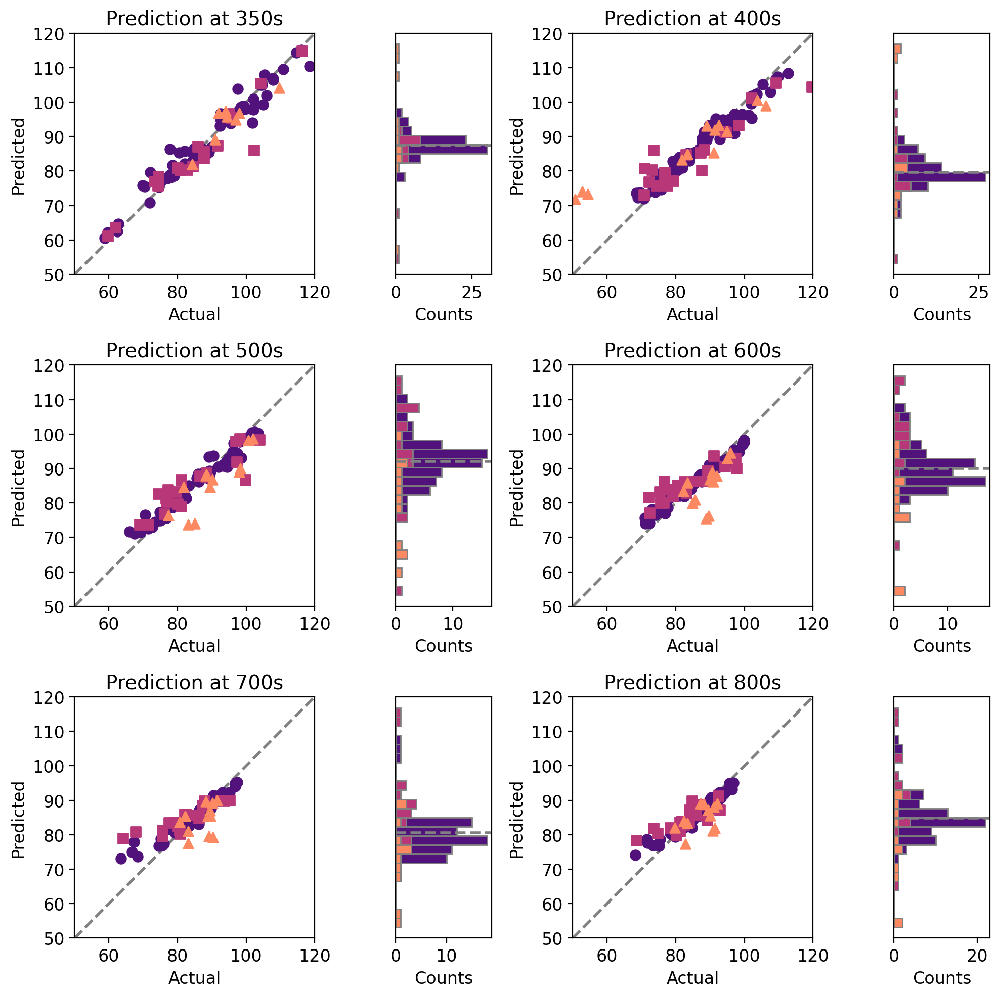

In [25]:
font_size = 12
sns.reset_orig()
plt.rcdefaults()
colors = sns.color_palette("magma", 3)
train_color, val_color, test_color = colors[0], colors[1], colors[2]
fig = plt.figure(figsize=(10, 10))
gs = GridSpec(3, 4, width_ratios=[5, 2] * 2, height_ratios=[1, 1, 1])

def plot_parity_and_hist(ax_parity, ax_hist, key):
    y_train = pred_train[key]
    y_val = pred_val[key]
    y_test = pred_test[key]
    actual_train_key = true_train[key]
    actual_val_key = true_val[key]
    actual_test_key = true_test[key]

    train_errors = y_train - actual_train_key
    val_errors = y_val - actual_val_key
    test_errors = y_test - actual_test_key

    all_errors = np.concatenate([train_errors, val_errors, test_errors])
    bins = np.linspace(np.min(all_errors), np.max(all_errors), 25)

    ax_parity.scatter(actual_train_key, y_train, color=train_color, s=50, label='Train', marker='o')
    ax_parity.scatter(actual_val_key, y_val, color=val_color, s=50, label='Validation', marker='s')
    ax_parity.scatter(actual_test_key, y_test, color=test_color, s=50, label='Test', marker='^')
    ax_parity.plot([50, 120], [50, 120], '--', lw=2, color="grey", zorder=0)
    ax_parity.set_xlim(50, 120)
    ax_parity.set_ylim(50, 120)
    ax_parity.set_xlabel('Actual', fontsize=font_size)
    ax_parity.set_ylabel('Predicted', fontsize=font_size)
    ax_parity.set_title(f'Prediction at {key}s', fontsize=font_size+2)
    ax_parity.tick_params(axis='both', which='major', labelsize=font_size)

    ax_hist.hist(train_errors, bins=bins, color=train_color, orientation='horizontal', ec = "grey")
    ax_hist.hist(val_errors, bins=bins, color=val_color, orientation='horizontal', ec = "grey")
    ax_hist.hist(test_errors, bins=bins, color=test_color, orientation='horizontal', ec = "grey")
    ax_hist.axhline(0, color='grey', linestyle='--', linewidth=2)
    ax_hist.set_xlabel('Counts', fontsize=font_size)
    ax_hist.yaxis.set_ticks([])
    ax_hist.tick_params(axis='x', which='major', labelsize=font_size)

for i, key in enumerate(keys):
    row, col = divmod(i, 2)
    ax_parity = plt.subplot(gs[row, col * 2])    
    ax_hist = plt.subplot(gs[row, col * 2 + 1]) 
    plot_parity_and_hist(ax_parity, ax_hist, key)

plt.tight_layout()
plt.show()

### Early predictions

In [26]:
sample_1 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 0],
        predicted_test['key_400'].iloc[:, 0],
        predicted_test['key_500'].iloc[:, 0],
        predicted_test['key_600'].iloc[:, 0],
        predicted_test['key_700'].iloc[:, 0],
        predicted_test['key_800'].iloc[:, 0],
    ],
    axis=1
)

sample_2 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 1],
        predicted_test['key_400'].iloc[:, 1],
        predicted_test['key_500'].iloc[:, 1],
        predicted_test['key_600'].iloc[:, 1],
        predicted_test['key_700'].iloc[:, 1],
        predicted_test['key_800'].iloc[:, 1],
    ],
    axis=1
)

sample_3 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 2],
        predicted_test['key_400'].iloc[:, 2],
        predicted_test['key_500'].iloc[:, 2],
        predicted_test['key_600'].iloc[:, 2],
        predicted_test['key_700'].iloc[:, 2],
        predicted_test['key_800'].iloc[:, 2],
    ],
    axis=1
)

sample_4 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 3],
        predicted_test['key_400'].iloc[:, 3],
        predicted_test['key_500'].iloc[:, 3],
        predicted_test['key_600'].iloc[:, 3],
        predicted_test['key_700'].iloc[:, 3],
        predicted_test['key_800'].iloc[:, 3],
    ],
    axis=1
)

sample_5 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 4],
        predicted_test['key_400'].iloc[:, 4],
        predicted_test['key_500'].iloc[:, 4],
        predicted_test['key_600'].iloc[:, 4],
        predicted_test['key_700'].iloc[:, 4],
        predicted_test['key_800'].iloc[:, 4],
    ],
    axis=1
)

sample_6 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 5],
        predicted_test['key_400'].iloc[:, 5],
        predicted_test['key_500'].iloc[:, 5],
        predicted_test['key_600'].iloc[:, 5],
        predicted_test['key_700'].iloc[:, 5],
        predicted_test['key_800'].iloc[:, 5],
    ],
    axis=1
)

sample_7 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 6],
        predicted_test['key_400'].iloc[:, 6],
        predicted_test['key_500'].iloc[:, 6],
        predicted_test['key_600'].iloc[:, 6],
        predicted_test['key_700'].iloc[:, 6],
        predicted_test['key_800'].iloc[:, 6],
    ],
    axis=1
)

sample_8 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 7],
        predicted_test['key_400'].iloc[:, 7],
        predicted_test['key_500'].iloc[:, 7],
        predicted_test['key_600'].iloc[:, 7],
        predicted_test['key_700'].iloc[:, 7],
        predicted_test['key_800'].iloc[:, 7],
    ],
    axis=1
)

sample_9 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 8],
        predicted_test['key_400'].iloc[:, 8],
        predicted_test['key_500'].iloc[:, 8],
        predicted_test['key_600'].iloc[:, 8],
        predicted_test['key_700'].iloc[:, 8],
        predicted_test['key_800'].iloc[:, 8],
    ],
    axis=1
)

sample_10 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 9],
        predicted_test['key_400'].iloc[:, 9],
        predicted_test['key_500'].iloc[:, 9],
        predicted_test['key_600'].iloc[:, 9],
        predicted_test['key_700'].iloc[:, 9],
        predicted_test['key_800'].iloc[:, 9],
    ],
    axis=1
)

sample_11 = pd.concat(
    [
        predicted_test['key_350'].iloc[:, 10],
        predicted_test['key_400'].iloc[:, 10],
        predicted_test['key_500'].iloc[:, 10],
        predicted_test['key_600'].iloc[:, 10],
        predicted_test['key_700'].iloc[:, 10],
        predicted_test['key_800'].iloc[:, 10],
    ],
    axis=1
)

sample_12 = pd.concat   ( [
        predicted_test['key_350'].iloc[:, 11],
        predicted_test['key_400'].iloc[:, 11],
        predicted_test['key_500'].iloc[:, 11],
        predicted_test['key_600'].iloc[:, 11],
        predicted_test['key_700'].iloc[:, 11],
        predicted_test['key_800'].iloc[:, 11],
    ],
    axis=1)

column_names = [
    'Charge saving score 350',
    'Charge saving score 400',
    'Charge saving score 500',
    'Charge saving score 600',
    'Charge saving score 700',
    'Charge saving score 800'
]

# Apply column names to each sample DataFrame
for sample in [sample_1, sample_2, sample_3, sample_4, sample_5, sample_6, sample_7, sample_8, sample_9, sample_10, sample_11, sample_12]:
    sample.columns = column_names

In [27]:
def calculate_confidence_interval(column, confidence=0.95):
    mean = column.mean()
    sem = stats.sem(column)
    margin = sem * stats.t.ppf((1 + confidence) / 2, len(column) - 1)
    return mean - margin, mean + margin

confidence_intervals_sample_1 = {col: calculate_confidence_interval(sample_1[col]) for col in sample_1.columns}
confidence_intervals_sample_2 = {col: calculate_confidence_interval(sample_2[col]) for col in sample_2.columns}
confidence_intervals_sample_3 = {col: calculate_confidence_interval(sample_3[col]) for col in sample_3.columns}
confidence_intervals_sample_4 = {col: calculate_confidence_interval(sample_4[col]) for col in sample_4.columns}
confidence_intervals_sample_5 = {col: calculate_confidence_interval(sample_5[col]) for col in sample_5.columns}
confidence_intervals_sample_6 = {col: calculate_confidence_interval(sample_6[col]) for col in sample_6.columns}
confidence_intervals_sample_7 = {col: calculate_confidence_interval(sample_7[col]) for col in sample_7.columns}
confidence_intervals_sample_8 = {col: calculate_confidence_interval(sample_8[col]) for col in sample_8.columns}
confidence_intervals_sample_9 = {col: calculate_confidence_interval(sample_9[col]) for col in sample_9.columns}
confidence_intervals_sample_10 = {col: calculate_confidence_interval(sample_10[col]) for col in sample_10.columns}
confidence_intervals_sample_11 = {col: calculate_confidence_interval(sample_11[col]) for col in sample_11.columns}
confidence_intervals_sample_12 = {col: calculate_confidence_interval(sample_12[col]) for col in sample_12.columns}

def plot_confidence_intervals(data, dataset_name):
    # Calculate confidence intervals
    confidence_intervals = {col: calculate_confidence_interval(data[col]) for col in data.columns}
    
    # Extract mean and confidence bounds
    means = [(ci[0] + ci[1]) / 2 for ci in confidence_intervals.values()]
    lower_bounds = [ci[0] for ci in confidence_intervals.values()]
    upper_bounds = [ci[1] for ci in confidence_intervals.values()]
    time_frames = [col.split()[-1] for col in data.columns]

    return means, lower_bounds, upper_bounds, time_frames

means_1, lb_1, ub_1, tf_1 = plot_confidence_intervals(sample_1, "Trip 1")
means_2, lb_2, ub_2, tf_2 = plot_confidence_intervals(sample_2, "Trip 2")
means_3, lb_3, ub_3, tf_3 = plot_confidence_intervals(sample_3, "Trip 3")
means_4, lb_4, ub_4, tf_4 = plot_confidence_intervals(sample_4, "Trip 4")
means_5, lb_5, ub_5, tf_5 = plot_confidence_intervals(sample_5, "Trip 5")
means_6, lb_6, ub_6, tf_6 = plot_confidence_intervals(sample_6, "Trip 6")
means_7, lb_7, ub_7, tf_7 = plot_confidence_intervals(sample_7, "Trip 7")
means_8, lb_8, ub_8, tf_8 = plot_confidence_intervals(sample_8, "Trip 8")
means_9, lb_9, ub_9, tf_9 = plot_confidence_intervals(sample_9, "Trip 9")
means_10, lb_10, ub_10, tf_10 = plot_confidence_intervals(sample_10, "Trip 10")
means_11, lb_11, ub_11, tf_11 = plot_confidence_intervals(sample_11, "Trip 11")
means_12, lb_12, ub_12, tf_12 = plot_confidence_intervals(sample_12, "Trip 12")

In [28]:
# Slice all means, lb, ub, and tf arrays
means_1 = means_1[2:6]
lb_1 = lb_1[2:6]
ub_1 = ub_1[2:6]
tf_1 = tf_1[2:6]

means_2 = means_2[2:6]
lb_2 = lb_2[2:6]
ub_2 = ub_2[2:6]
tf_2 = tf_2[2:6]

means_3 = means_3[2:6]
lb_3 = lb_3[2:6]
ub_3 = ub_3[2:6]
tf_3 = tf_3[2:6]

means_4 = means_4[2:6]
lb_4 = lb_4[2:6]
ub_4 = ub_4[2:6]
tf_4 = tf_4[2:6]

means_5 = means_5[2:6]
lb_5 = lb_5[2:6]
ub_5 = ub_5[2:6]
tf_5 = tf_5[2:6]

means_6 = means_6[2:6]
lb_6 = lb_6[2:6]
ub_6 = ub_6[2:6]
tf_6 = tf_6[2:6]

means_7 = means_7[2:6]
lb_7 = lb_7[2:6]
ub_7 = ub_7[2:6]
tf_7 = tf_7[2:6]

means_8 = means_8[2:6]
lb_8 = lb_8[2:6]
ub_8 = ub_8[2:6]
tf_8 = tf_8[2:6]

means_9 = means_9[2:6]
lb_9 = lb_9[2:6]
ub_9 = ub_9[2:6]
tf_9 = tf_9[2:6]

means_10 = means_10[2:6]
lb_10 = lb_10[2:6]
ub_10 = ub_10[2:6]
tf_10 = tf_10[2:6]

means_11 = means_11[2:6]
lb_11 = lb_11[2:6]
ub_11 = ub_11[2:6]
tf_11 = tf_11[2:6]

means_12 = means_12[2:6]
lb_12 = lb_12[2:6]
ub_12 = ub_12[2:6]
tf_12 = tf_12[2:6]

In [29]:
classification_test

,Defensive driving style,Assertive driving style,Downhill terrain,Flat plane terrain,Uphill terrain,Charge & no rest (a),No charge & no rest (b),No charge & no rest (c),No charge & no rest (d),Charge & rest (a),Charge & rest (b),Charge & rest (c),Cell ID (a),Cell ID (b),Cell ID (c)
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


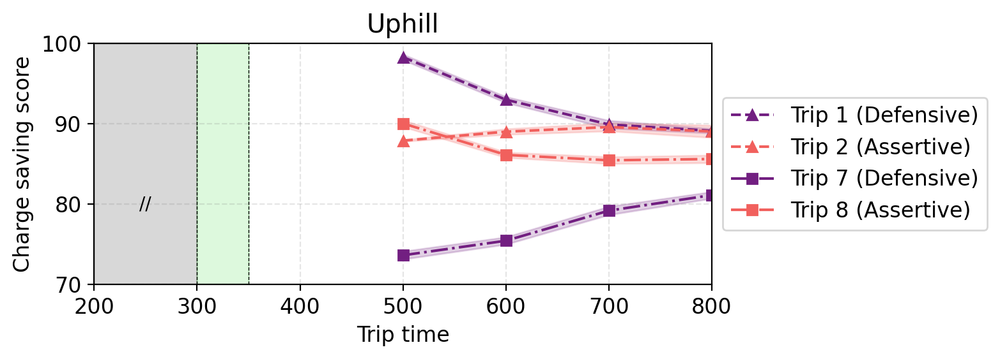

In [30]:
sns.reset_orig()
plt.rcdefaults()
plt.figure(figsize=(6, 3))
plt.rcParams['font.size'] = 12
colors = sns.color_palette("magma", 2)

time_frames = [500, 600, 700, 800]

plt.plot(time_frames, means_1, marker='^', label='Trip 1 (Defensive)', color=colors[0], linestyle="--")
plt.fill_between(time_frames, lb_1, ub_1, color=colors[0], alpha=0.2)
plt.plot(time_frames, means_2, marker='^', label='Trip 2 (Assertive)', color=colors[1], linestyle="--")
plt.fill_between(time_frames, lb_2, ub_2, color=colors[1], alpha=0.2)

plt.plot(time_frames, means_7, marker='s', label='Trip 7 (Defensive)', color=colors[0], linestyle="-.")
plt.fill_between(time_frames, lb_7, ub_7, color=colors[0], alpha=0.2)
plt.plot(time_frames, means_8, marker='s', label='Trip 8 (Assertive)', color=colors[1], linestyle="-.")
plt.fill_between(time_frames, lb_8, ub_8, color=colors[1], alpha=0.2)

plt.axvspan(200, 300, color='grey', alpha=0.3)
plt.axvspan(300, 350, color='lightgreen', alpha=0.3)
plt.axvline(300, color='black', linestyle='--', linewidth=0.5)
plt.axvline(350, color='black', linestyle='--', linewidth=0.5)
plt.grid(color="grey", alpha=0.2, linestyle="--")
plt.text(250, 80, "//", fontsize=10, va='center', ha='center', color='black')

plt.title('Uphill')
plt.xlabel('Trip time')
plt.ylabel('Charge saving score')
plt.ylim(70, 100)
plt.xlim(200, 800)
plt.tight_layout()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

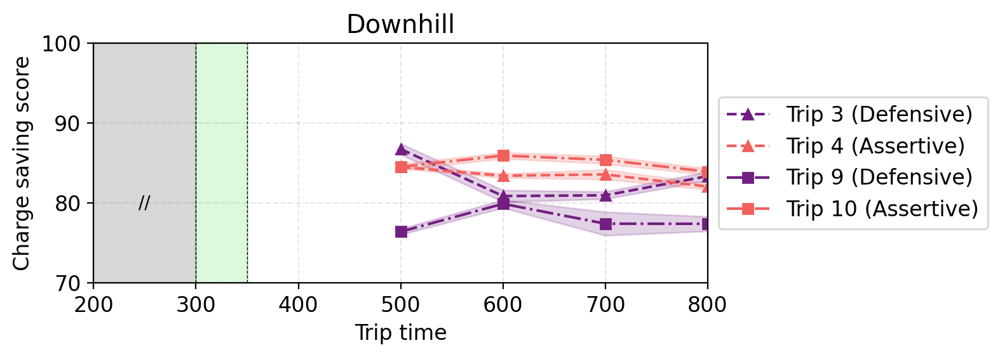

In [31]:
sns.reset_orig()
plt.rcdefaults()
plt.figure(figsize=(6, 3))
plt.rcParams['font.size'] = 12
colors = sns.color_palette("magma", 2)

time_frames = [500, 600, 700, 800]

plt.plot(time_frames, means_3, marker='^', label='Trip 3 (Defensive)', color=colors[0], linestyle="--")
plt.fill_between(time_frames, lb_3, ub_3, color=colors[0], alpha=0.2)
plt.plot(time_frames, means_4, marker='^', label='Trip 4 (Assertive)', color=colors[1], linestyle="--")
plt.fill_between(time_frames, lb_4, ub_4, color=colors[1], alpha=0.2)
plt.plot(time_frames, means_9, marker='s', label='Trip 9 (Defensive)', color=colors[0], linestyle="-.")
plt.fill_between(time_frames, lb_9, ub_9, color=colors[0], alpha=0.2)
plt.plot(time_frames, means_10, marker='s', label='Trip 10 (Assertive)', color=colors[1], linestyle="-.")
plt.fill_between(time_frames, lb_10, ub_10, color=colors[1], alpha=0.2)

plt.axvspan(200, 300, color='grey', alpha=0.3)
plt.axvspan(300, 350, color='lightgreen', alpha=0.3)
plt.axvline(300, color='black', linestyle='--', linewidth=0.5)
plt.axvline(350, color='black', linestyle='--', linewidth=0.5)
plt.grid(color="grey", alpha=0.2, linestyle="--")
plt.text(250, 80, "//", fontsize=10, va='center', ha='center', color='black')

plt.title('Downhill')
plt.xlabel('Trip time')
plt.ylabel('Charge saving score')
plt.ylim(70, 100)
plt.xlim(200, 800)
plt.tight_layout()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


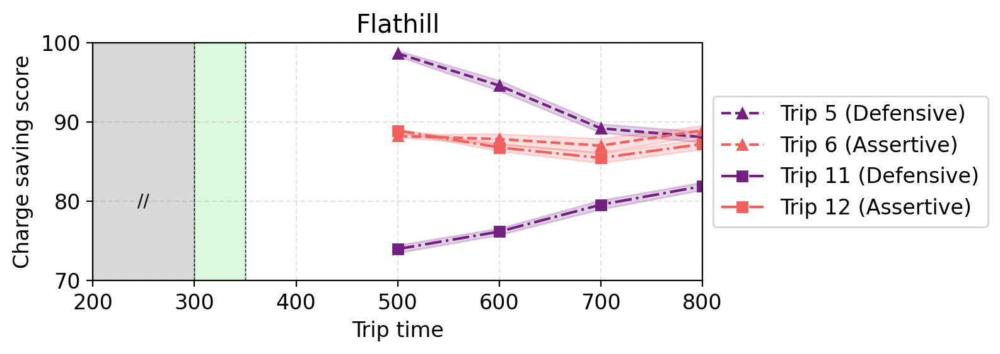

In [32]:
sns.reset_orig()
plt.rcdefaults()
plt.figure(figsize=(6, 3))
plt.rcParams['font.size'] = 12
colors = sns.color_palette("magma", 2)

time_frames = [500, 600, 700, 800]
plt.plot(time_frames, means_5, marker='^', label='Trip 5 (Defensive)', color=colors[0], linestyle="--")
plt.fill_between(time_frames, lb_5, ub_5, color=colors[0], alpha=0.2)
plt.plot(time_frames, means_6, marker='^', label='Trip 6 (Assertive)', color=colors[1], linestyle="--")
plt.fill_between(time_frames, lb_6, ub_6, color=colors[1], alpha=0.2)
plt.plot(time_frames, means_11, marker='s', label='Trip 11 (Defensive)', color=colors[0], linestyle="-.")
plt.fill_between(time_frames, lb_11, ub_11, color=colors[0], alpha=0.2)
plt.plot(time_frames, means_12, marker='s', label='Trip 12 (Assertive)', color=colors[1], linestyle="-.")
plt.fill_between(time_frames, lb_12, ub_12, color=colors[1], alpha=0.2)

plt.axvspan(200, 300, color='grey', alpha=0.3)
plt.axvspan(300, 350, color='lightgreen', alpha=0.3)
plt.axvline(300, color='black', linestyle='--', linewidth=0.5)
plt.axvline(350, color='black', linestyle='--', linewidth=0.5)
plt.grid(color="grey", alpha=0.2, linestyle="--")
plt.text(250, 80, "//", fontsize=10, va='center', ha='center', color='black')

plt.title('Flathill')
plt.xlabel('Trip time')
plt.ylabel('Charge saving score')
plt.ylim(70, 100)
plt.xlim(200, 800)
plt.tight_layout()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

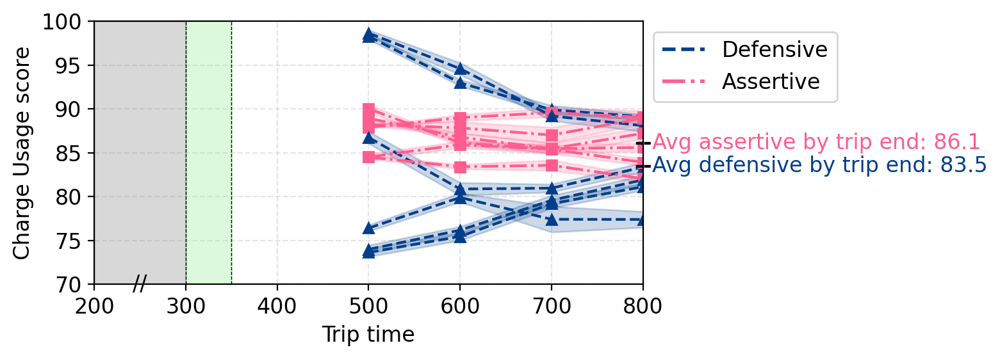

In [87]:
sns.reset_orig()
plt.rcdefaults()
fig = plt.figure(figsize=(8, 3))
plt.rcParams['font.size'] = 12
time_frames = [500, 600, 700, 800]

plt.plot(time_frames, means_1, marker='^', label='Trip 1 (Defensive)', color='#023e8a', linestyle="--")
plt.fill_between(time_frames, lb_1, ub_1, color='#023e8a', alpha=0.2)
plt.plot(time_frames, means_2, marker='s', label='Trip 2 (Assertive)', color='#ff5d8f', linestyle="-.")
plt.fill_between(time_frames, lb_2, ub_2, color='#ff5d8f', alpha=0.2)
plt.plot(time_frames, means_7, marker='^', label='Trip 7 (Defensive)', color='#023e8a', linestyle="--")
plt.fill_between(time_frames, lb_7, ub_7, color='#023e8a', alpha=0.2)
plt.plot(time_frames, means_8, marker='s', label='Trip 8 (Assertive)', color='#ff5d8f', linestyle="-.")
plt.fill_between(time_frames, lb_8, ub_8, color='#ff5d8f', alpha=0.2)

plt.plot(time_frames, means_3, marker='^', label='Trip 3 (Defensive)', color='#023e8a', linestyle="--")
plt.fill_between(time_frames, lb_3, ub_3, color='#023e8a', alpha=0.2)
plt.plot(time_frames, means_4, marker='s', label='Trip 4 (Assertive)', color='#ff5d8f', linestyle="-.")
plt.fill_between(time_frames, lb_4, ub_4, color='#ff5d8f', alpha=0.2)
plt.plot(time_frames, means_9, marker='^', label='Trip 9 (Defensive)', color='#023e8a', linestyle="--")
plt.fill_between(time_frames, lb_9, ub_9, color='#023e8a', alpha=0.2)
plt.plot(time_frames, means_10, marker='s', label='Trip 10 (Assertive)', color='#ff5d8f', linestyle="-.")
plt.fill_between(time_frames, lb_10, ub_10, color='#ff5d8f', alpha=0.2)

plt.plot(time_frames, means_5, marker='^', label='Trip 5 (Defensive)', color='#023e8a', linestyle="--")
plt.fill_between(time_frames, lb_5, ub_5, color='#023e8a', alpha=0.2)
plt.plot(time_frames, means_6, marker='s', label='Trip 6 (Assertive)', color='#ff5d8f', linestyle="-.")
plt.fill_between(time_frames, lb_6, ub_6, color='#ff5d8f', alpha=0.2)
plt.plot(time_frames, means_11, marker='^', label='Trip 11 (Defensive)', color='#023e8a', linestyle="--")
plt.fill_between(time_frames, lb_11, ub_11, color='#023e8a', alpha=0.2)
plt.plot(time_frames, means_12, marker='s', label='Trip 12 (Assertive)', color='#ff5d8f', linestyle="-.")
plt.fill_between(time_frames, lb_12, ub_12, color='#ff5d8f', alpha=0.2)

plt.axvspan(200, 300, color='grey', alpha=0.3)
plt.axvspan(300, 350, color='lightgreen', alpha=0.3)
plt.axvline(300, color='black', linestyle='--', linewidth=0.5)
plt.axvline(350, color='black', linestyle='--', linewidth=0.5)
plt.grid(color="grey", alpha=0.2, linestyle="--")
plt.gca().set_axisbelow(True)
plt.text(250, 70, "//", fontsize=12, va='center', ha='center', color='black')

defensive_trips = [means_1[-1], means_3[-1], means_5[-1], means_7[-1], means_9[-1], means_11[-1]]
assertive_trips = [means_2[-1], means_4[-1], means_6[-1], means_8[-1], means_10[-1], means_12[-1]]

avg_defensive = np.mean(defensive_trips)
avg_assertive = np.mean(assertive_trips)


plt.text(800, avg_defensive, "--", fontsize=12, va='center', ha='center', color='black', weight='bold')
plt.text(800, avg_assertive, "--", fontsize=12, va='center', ha='center', color='black', weight='bold')
# plt.hlines(avg_defensive, 800, 850, colors='black', linestyles='--', linewidth=1, label='Defensive')
# plt.hlines(avg_assertive, 800, 850, colors='black', linestyles='-.', linewidth=1, label='Assertive')

# Add text annotation near the short lines
plt.text(810, avg_defensive, f'Avg defensive by trip end: {avg_defensive:.1f}', color='#023e8a', va='center')
plt.text(810, avg_assertive, f'Avg assertive by trip end: {avg_assertive:.1f}', color='#ff5d8f', va='center')
# Create custom legend handles
legend_elements = [
    Line2D([0], [0], color='#023e8a', lw=2, linestyle='--', label='Defensive'),
    Line2D([0], [0], color='#ff5d8f', lw=2, linestyle='-.', label='Assertive')]

# Add custom legend to plot
plt.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel('Trip time')
plt.ylabel('Charge Usage score')
plt.ylim(70, 100)
plt.xlim(200, 800)
plt.tight_layout()
fig.savefig('/Users/hemanthnr/Desktop/batt_patt figures/feedback.svg', format='svg', dpi=1000, bbox_inches='tight')
plt.show()

In [34]:
defensive_trips = [means_1[-1], means_3[-1], means_5[-1], means_7[-1], means_9[-1], means_11[-1]]
assertive_trips = [means_2[-1], means_4[-1], means_6[-1], means_8[-1], means_10[-1], means_12[-1]]

# Compute averages
avg_defensive = np.mean(defensive_trips)
avg_assertive = np.mean(assertive_trips)

print("Average Defensive value at x=800:", avg_defensive)
print("Average Assertive value at x=800:", avg_assertive)

Average Defensive value at x=800: 83.4990883374977
Average Assertive value at x=800: 86.12621527068178
